# Data Analytics and Machine Learning for Insurance Customer Eligibility Prediction

### Three databases:

1) Set of ID's, historical information on payments or non-payments of insurance premiums contracted with an insurance company; this information is presented in historical series of between 1 and 60 months.
    
2) Table with qualitative information for a series of IDs.

3) Complete address, zip code and state within the US.



### Object: 

*To know which new customers can be granted a free premium discount*.

In [1]:
# loading libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro
from sklearn.impute import KNNImputer
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import AdaBoostClassifier
import time
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import os
import joblib


In [2]:
# actual directory

print(os.getcwd())

c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\00_Prueba_Allianz\prueba


In [3]:
# loading data

df1 = pd.read_csv('.\paid_record(in).csv')
df2 = pd.read_csv('.\main(in).csv')
df3 = pd.read_csv(r'.\address(in).csv')

In [4]:
# creating copies from the original df so I can work with them without changing the original data

df1_copy = df1.copy()
df2_copy = df2.copy()
df3_copy = df3.copy()

## 1) Understanding the problem and dataset

#### df1

ID's, historical information of payments or non-payments of insurance premiums contracted with an insurance company.

    - ID: Customer ID
    - MONTHS BALANCE: 1-60, months of payment history. O: Balance of the most recent month, 1: Balance of the month prior to the most recent month, 2: Balance of the month prior to the previous month, etc.
    - STATUS: X: no installment, C: installment paid, 1: 1 to 30 days late, 2: 31 to 60 days late, 3: 61 to 90 days late, 4: 91 to 120 days late, 5: more than 120 days late.

In [5]:
# df1: paid_record(in).csv

df1.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [6]:
df1.shape

(1048575, 3)

In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [8]:
df1['ID'].nunique()

45985

In [9]:
df1[df1['ID']==5001711]

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0


In [10]:
df1['MONTHS_BALANCE'].unique()

array([  0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8,  -9, -10, -11, -12,
       -13, -14, -15, -16, -17, -18, -19, -20, -21, -22, -23, -24, -25,
       -26, -27, -28, -29, -30, -31, -32, -33, -34, -35, -36, -37, -38,
       -39, -40, -41, -42, -43, -44, -45, -46, -47, -48, -49, -50, -51,
       -52, -53, -54, -55, -56, -57, -58, -59, -60])

In [11]:
df1['STATUS'].unique()

array(['X', '0', 'C', '1', '2', '3', '4', '5'], dtype=object)

In [12]:
df1_copy.isnull().sum()

ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [13]:
df1_copy.duplicated().sum()

np.int64(0)

#### df2

Table with info:

    CODE_GENDER (M, F), FLAG_OWN_CAR (Y, N), FLAG_OWN_REALTY (real estate; Y, N), CNT_CHILDREN (number of children), AMT_INCOME_TOTAL (total annual income), NAME_INCOME_TYPE (type of income: employee, pensioner.... ), NAME_EDUCATION_TYPE (education level), NAME_FAMILY_STATUS (marital status), NAME_HOUSING_TYPE (type of housing), DAYS_EMPLOYED (days since last job), FLAG_MOBIL (1, 0), FLAG_WORK_PHONE (1, 0), FLAG_PHONE (landline; 1, 0), FLAG_EMAIL (1, 0), OCCUPATION_TYPE (type of occupation), CNT_FAM_MEMBERS (number of family members), DAYS_BIRTH_CLEAN (days since date of birth), Letter (from ID), Main_ID (main ID).

In [14]:
# df2 : main(in).csv

df2_copy.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,Main_ID
0,M,Y,Y,0.0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-4542.0,1.0,1.0,0.0,0.0,NaN,2.0,09/04/1990,L,5008804
1,M,Y,Y,0.0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-4542.0,1.0,1.0,0.0,0.0,NaN,2.0,09/04/1990,G,5008805
2,M,Y,Y,0.0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-1134.0,1.0,0.0,0.0,0.0,Security staff,2.0,06/05/1964,D,5008806
3,F,N,Y,0.0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-3051.0,1.0,0.0,1.0,1.0,Sales staff,1.0,26/10/1970,I,5008808
4,F,NaN,Y,0.0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-3051.0,1.0,0.0,1.0,1.0,Sales staff,1.0,26/10/1970,Z,5008809


In [15]:
df2_copy.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_EMPLOYED',
       'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'DAYS_BIRTH_CLEAN', 'Letter',
       'Main_ID'],
      dtype='object')

In [16]:
df2_copy.shape

(438757, 19)

In [17]:
df2_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438757 entries, 0 to 438756
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   CODE_GENDER          427894 non-null  object 
 1   FLAG_OWN_CAR         427705 non-null  object 
 2   FLAG_OWN_REALTY      427806 non-null  object 
 3   CNT_CHILDREN         427826 non-null  float64
 4   AMT_INCOME_TOTAL     427624 non-null  float64
 5   NAME_INCOME_TYPE     427718 non-null  object 
 6   NAME_EDUCATION_TYPE  427654 non-null  object 
 7   NAME_FAMILY_STATUS   427772 non-null  object 
 8   NAME_HOUSING_TYPE    427693 non-null  object 
 9   DAYS_EMPLOYED        427784 non-null  float64
 10  FLAG_MOBIL           427690 non-null  float64
 11  FLAG_WORK_PHONE      427715 non-null  float64
 12  FLAG_PHONE           427674 non-null  float64
 13  FLAG_EMAIL           427770 non-null  float64
 14  OCCUPATION_TYPE      296952 non-null  object 
 15  CNT_FAM_MEMBERS  

In [18]:
df2_copy['Main_ID'].nunique()

438510

In [19]:
df2_copy.rename(columns={'Main_ID':'ID'}, inplace=True)

In [20]:
df2_copy['ID'].nunique()

438510

In [21]:
df2_copy.dtypes

CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN           float64
AMT_INCOME_TOTAL       float64
NAME_INCOME_TYPE        object
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
DAYS_EMPLOYED          float64
FLAG_MOBIL             float64
FLAG_WORK_PHONE        float64
FLAG_PHONE             float64
FLAG_EMAIL             float64
OCCUPATION_TYPE         object
CNT_FAM_MEMBERS        float64
DAYS_BIRTH_CLEAN        object
Letter                  object
ID                       int64
dtype: object

In [22]:
df2_copy.isnull().sum()

CODE_GENDER             10863
FLAG_OWN_CAR            11052
FLAG_OWN_REALTY         10951
CNT_CHILDREN            10931
AMT_INCOME_TOTAL        11133
NAME_INCOME_TYPE        11039
NAME_EDUCATION_TYPE     11103
NAME_FAMILY_STATUS      10985
NAME_HOUSING_TYPE       11064
DAYS_EMPLOYED           10973
FLAG_MOBIL              11067
FLAG_WORK_PHONE         11042
FLAG_PHONE              11083
FLAG_EMAIL              10987
OCCUPATION_TYPE        141805
CNT_FAM_MEMBERS         10934
DAYS_BIRTH_CLEAN        10715
Letter                      0
ID                          0
dtype: int64

In [23]:
df2_copy.duplicated().sum()

np.int64(0)

#### df3

In [24]:
# df3 : address(in).csv

df3_copy.head()

,New_ID,ADDRESS
0,"5008804L,""06042, CT, 31 Mitchell Road""",NaN
1,"5008805G,""72703, AR, 1189 Northwest End Avenue""",NaN
2,"5008806D,""72701, AR, 218 Shipley Alley""",NaN
3,"5008808I,""3138 P Street Northwest, 20007, DC""",NaN
4,"5008809Z,""2405 230th Street, 21122, MD""",NaN


In [25]:
df3_copy.shape

(438757, 2)

In [26]:
df3_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438757 entries, 0 to 438756
Data columns (total 2 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   New_ID   438757 non-null  object 
 1   ADDRESS  0 non-null       float64
dtypes: float64(1), object(1)
memory usage: 6.7+ MB


In [27]:
df3_copy['New_ID'].nunique()

438657

In [28]:
df3_copy.isnull().sum()

New_ID          0
ADDRESS    438757
dtype: int64

In [29]:
df3_copy.duplicated().sum()

np.int64(100)

In [30]:
df3_copy[df3_copy.duplicated()]

,New_ID,ADDRESS
438657,"6477848,""6702 Johnny Mercer Boulevard, 31410, GA""",NaN
438658,"6779547,""06040, CT, 739 Center Street""",NaN
438659,"6691705,""68 Hampstead Place, 01331, MA""",NaN
438660,"6747064,""9 Brooklyn Street, 05488, VT""",NaN
438661,"5559115,""713 East 32nd Street, 31401, GA""",NaN
...,...,...
438752,"5680433,""37080, TN, 7730 Wilkinson Road""",NaN
438753,"5353755,""2815 Saint Edwards Drive, 37211, TN""",NaN
438754,"5689895,""85306, AZ, 5434 West Beck Lane""",NaN
438755,"5833391,""05641, VT, 21 Hill Street""",NaN


We can see the table is not well structured, as all the info is in one column. We will need to separate the info into different columns.

In [31]:
df3_copy.drop_duplicates(inplace=True)

In [32]:
df3_copy.duplicated().sum()

np.int64(0)

First, let's create a correct ID column.

In [33]:
df3_copy['New_ID2'] = df3_copy['New_ID'].str.split(',').str[0]
df3_copy

,New_ID,ADDRESS,New_ID2
0,"5008804L,""06042, CT, 31 Mitchell Road""",NaN,5008804L
1,"5008805G,""72703, AR, 1189 Northwest End Avenue""",NaN,5008805G
2,"5008806D,""72701, AR, 218 Shipley Alley""",NaN,5008806D
3,"5008808I,""3138 P Street Northwest, 20007, DC""",NaN,5008808I
4,"5008809Z,""2405 230th Street, 21122, MD""",NaN,5008809Z
...,...,...,...
438652,"5680433,""37080, TN, 7730 Wilkinson Road""",NaN,5680433
438653,"5353755,""2815 Saint Edwards Drive, 37211, TN""",NaN,5353755
438654,"5689895,""85306, AZ, 5434 West Beck Lane""",NaN,5689895
438655,"5833391,""05641, VT, 21 Hill Street""",NaN,5833391


Now, the address.

In [34]:
regex_pattern = r'"([^"]*)"' ## capture any text between double quotes
df3_copy['ADDRESS'] = df3_copy['New_ID'].str.extract(regex_pattern)
df3_copy

,New_ID,ADDRESS,New_ID2
0,"5008804L,""06042, CT, 31 Mitchell Road""","06042, CT, 31 Mitchell Road",5008804L
1,"5008805G,""72703, AR, 1189 Northwest End Avenue""","72703, AR, 1189 Northwest End Avenue",5008805G
2,"5008806D,""72701, AR, 218 Shipley Alley""","72701, AR, 218 Shipley Alley",5008806D
3,"5008808I,""3138 P Street Northwest, 20007, DC""","3138 P Street Northwest, 20007, DC",5008808I
4,"5008809Z,""2405 230th Street, 21122, MD""","2405 230th Street, 21122, MD",5008809Z
...,...,...,...
438652,"5680433,""37080, TN, 7730 Wilkinson Road""","37080, TN, 7730 Wilkinson Road",5680433
438653,"5353755,""2815 Saint Edwards Drive, 37211, TN""","2815 Saint Edwards Drive, 37211, TN",5353755
438654,"5689895,""85306, AZ, 5434 West Beck Lane""","85306, AZ, 5434 West Beck Lane",5689895
438655,"5833391,""05641, VT, 21 Hill Street""","05641, VT, 21 Hill Street",5833391


    - For future analysis, we also can separate the address into different columns, such as zip code, state, etc. and use it to analyze the data and make predictions.

In [35]:
df3_copy.drop(['New_ID'], axis=1, inplace=True)
df3_copy

,ADDRESS,New_ID2
0,"06042, CT, 31 Mitchell Road",5008804L
1,"72703, AR, 1189 Northwest End Avenue",5008805G
2,"72701, AR, 218 Shipley Alley",5008806D
3,"3138 P Street Northwest, 20007, DC",5008808I
4,"2405 230th Street, 21122, MD",5008809Z
...,...,...
438652,"37080, TN, 7730 Wilkinson Road",5680433
438653,"2815 Saint Edwards Drive, 37211, TN",5353755
438654,"85306, AZ, 5434 West Beck Lane",5689895
438655,"05641, VT, 21 Hill Street",5833391


As the ID column has different formats, some of them comes with a letter, some of them comes just with a number, we will create a new column with only the number of the ID.

In [36]:
df3_copy['New_ID2'].dtype

dtype('O')

In [37]:
df3_copy['New_ID2'] = df3_copy['New_ID2'].astype(str)

In [38]:
def adjust_id(new_id):
    if len(new_id) == 7:
        return new_id
    else:
        return new_id[:7]

In [39]:
df3_copy['ID'] = df3_copy['New_ID2'].apply(adjust_id)

In [40]:

df3_copy

,ADDRESS,New_ID2,ID
0,"06042, CT, 31 Mitchell Road",5008804L,5008804
1,"72703, AR, 1189 Northwest End Avenue",5008805G,5008805
2,"72701, AR, 218 Shipley Alley",5008806D,5008806
3,"3138 P Street Northwest, 20007, DC",5008808I,5008808
4,"2405 230th Street, 21122, MD",5008809Z,5008809
...,...,...,...
438652,"37080, TN, 7730 Wilkinson Road",5680433,5680433
438653,"2815 Saint Edwards Drive, 37211, TN",5353755,5353755
438654,"85306, AZ, 5434 West Beck Lane",5689895,5689895
438655,"05641, VT, 21 Hill Street",5833391,5833391


In [41]:
df3_copy['ID'] = df3_copy['ID'].astype(int)

#### Merging tables

In [42]:
df1_copy.columns

Index(['ID', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [43]:
df2_copy.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'DAYS_EMPLOYED',
       'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'DAYS_BIRTH_CLEAN', 'Letter',
       'ID'],
      dtype='object')

In [44]:
df3_copy.columns

Index(['ADDRESS', 'New_ID2', 'ID'], dtype='object')

In [45]:
# mergind the dataframes on the ID column

df_merged = pd.merge(df1_copy, df2_copy, on='ID', how='left')


In [46]:
df_merged

,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,...,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter
0,5001711,0,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5001711,-1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5001711,-2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5001711,-3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5001712,0,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1051630,5150487,-25,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q
1051631,5150487,-26,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q
1051632,5150487,-27,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q
1051633,5150487,-28,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q


In [47]:
df_merged_copy = pd.merge(df_merged, df3_copy, on='ID', how='left')

In [48]:
df_merged_copy = df_merged.copy()

In [49]:
df_merged_copy

,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,...,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter
0,5001711,0,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5001711,-1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5001711,-2,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5001711,-3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5001712,0,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1051630,5150487,-25,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q
1051631,5150487,-26,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q
1051632,5150487,-27,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q
1051633,5150487,-28,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,...,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q


In [50]:
df_merged_copy.to_csv('merged_data.csv', index=False) # saving the merged data

In [51]:
df_merged_copy.isnull().sum() # checking for missing values

ID                          0
MONTHS_BALANCE              0
STATUS                      0
CODE_GENDER            290060
FLAG_OWN_CAR           289972
FLAG_OWN_REALTY        289919
CNT_CHILDREN           289854
AMT_INCOME_TOTAL       289760
NAME_INCOME_TYPE       290560
NAME_EDUCATION_TYPE    290790
NAME_FAMILY_STATUS     289846
NAME_HOUSING_TYPE      290197
DAYS_EMPLOYED          290224
FLAG_MOBIL             289730
FLAG_WORK_PHONE        291021
FLAG_PHONE             291672
FLAG_EMAIL             289482
OCCUPATION_TYPE        524833
CNT_FAM_MEMBERS        288884
DAYS_BIRTH_CLEAN       288977
Letter                 270860
dtype: int64

In [52]:
df_merged_copy.shape

(1051635, 21)

In [53]:
df_merged_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1051635 entries, 0 to 1051634
Data columns (total 21 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   ID                   1051635 non-null  int64  
 1   MONTHS_BALANCE       1051635 non-null  int64  
 2   STATUS               1051635 non-null  object 
 3   CODE_GENDER          761575 non-null   object 
 4   FLAG_OWN_CAR         761663 non-null   object 
 5   FLAG_OWN_REALTY      761716 non-null   object 
 6   CNT_CHILDREN         761781 non-null   float64
 7   AMT_INCOME_TOTAL     761875 non-null   float64
 8   NAME_INCOME_TYPE     761075 non-null   object 
 9   NAME_EDUCATION_TYPE  760845 non-null   object 
 10  NAME_FAMILY_STATUS   761789 non-null   object 
 11  NAME_HOUSING_TYPE    761438 non-null   object 
 12  DAYS_EMPLOYED        761411 non-null   float64
 13  FLAG_MOBIL           761905 non-null   float64
 14  FLAG_WORK_PHONE      760614 non-null   float64
 15

In [54]:
df_merged_copy[df_merged_copy['STATUS'] == 'X']['ID'].nunique() # number of clients with status X, which means they have no credit

25005

Clients with X STATUS are clients that have no installment, it could be clients who asked for a small loan and paid it off, or clients who have no installment at all. We will keep them out of the analysis later on.

In [55]:
df_merged_copy['BIRTHDAY'] = pd.to_datetime(df_merged_copy['DAYS_BIRTH_CLEAN'], format='%d/%m/%Y', errors='coerce')

In [56]:
df_merged_copy['BIRTHDAY'] = df_merged_copy['BIRTHDAY'].dt.strftime('%d/%m/%Y')

In [57]:
df_merged_copy['DAYS_BIRTH_CLEAN'].unique()

array([nan, '09/04/1990', '07/06/1984', ..., '03/08/1962', '04/07/1978',
       '24/02/1989'], dtype=object)

In [58]:
# formatting the date of birth

## df_merged_copy['DAYS_BIRTH_CLEAN'] = (pd.to_datetime('today') - df_merged_copy['BIRTHDAY']).dt.days 

## it can't be done because there are missing values in the BIRTHDAY column, so we will try when we fill the missing values

In [59]:
cols_int = ['CNT_FAM_MEMBERS', 'FLAG_EMAIL', 'FLAG_PHONE', 'FLAG_WORK_PHONE', 'FLAG_MOBIL', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN']

In [61]:
# to show all columns

pd.set_option('display.max_columns', None)

In [62]:
df_merged_copy.tail(2)

,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,BIRTHDAY
1051633,5150487,-28,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,Married,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q,NaN
1051634,5150487,-29,C,M,Y,N,0.0,202500.0,Working,Secondary / secondary special,Married,NaN,-2166.0,1.0,0.0,0.0,0.0,Drivers,2.0,NaN,Q,NaN


In [63]:
df_merged_groupedID = df_merged_copy.groupby('ID').agg({'MONTHS_BALANCE':'count', 'STATUS':'sum'}).reset_index()
df_merged_groupedID

,ID,MONTHS_BALANCE,STATUS
0,5001711,4,X000
1,5001712,19,CCCCCCCCC0000000000
2,5001713,22,XXXXXXXXXXXXXXXXXXXXXX
3,5001714,15,XXXXXXXXXXXXXXX
4,5001715,60,XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...
...,...,...,...
45980,5150482,18,CCCCCC000000000000
45981,5150483,18,XXXXXXXXXXXXXXXXXX
45982,5150484,13,C000000000000
45983,5150485,2,00


## 2) Data treatment and cleansing


### Variable distribution before treatment

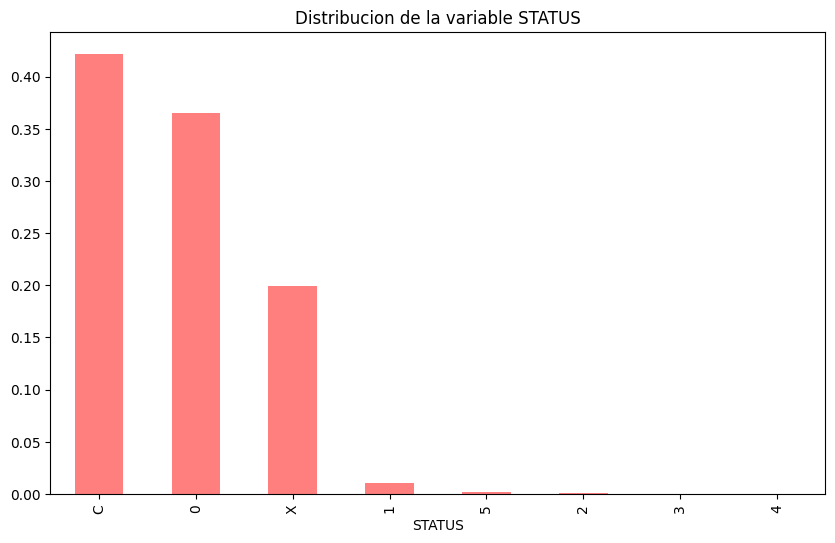

In [64]:
# distribution of the variable STATUS

df_merged_copy['STATUS'].value_counts(normalize=True).plot(kind='bar', color='red', alpha=0.5, figsize=(10,6), title='Distribucion de la variable STATUS')
plt.show()

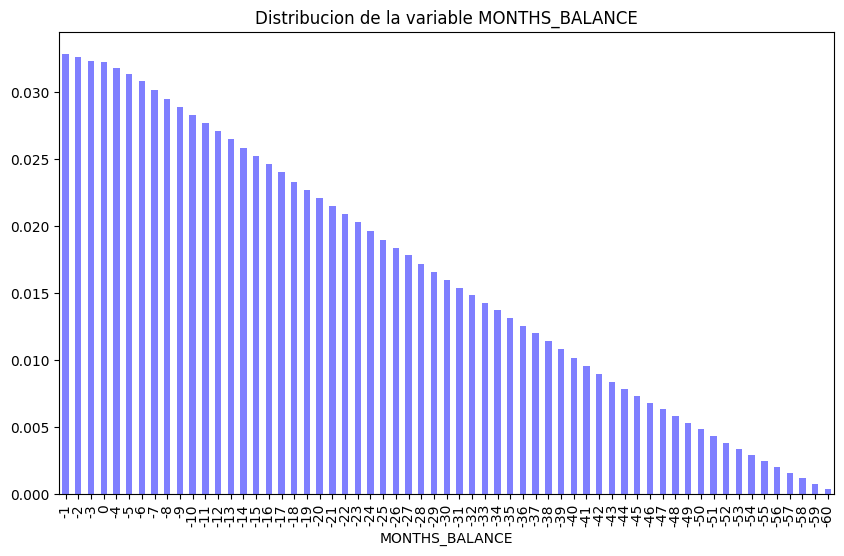

In [65]:
# MONTHS_BALANCE distribution

df_merged_copy['MONTHS_BALANCE'].value_counts(normalize=True).plot(kind='bar', color='blue', alpha=0.5, figsize=(10,6), title='Distribucion de la variable MONTHS_BALANCE')
plt.show()

<Axes: xlabel='CODE_GENDER', ylabel='Count'>

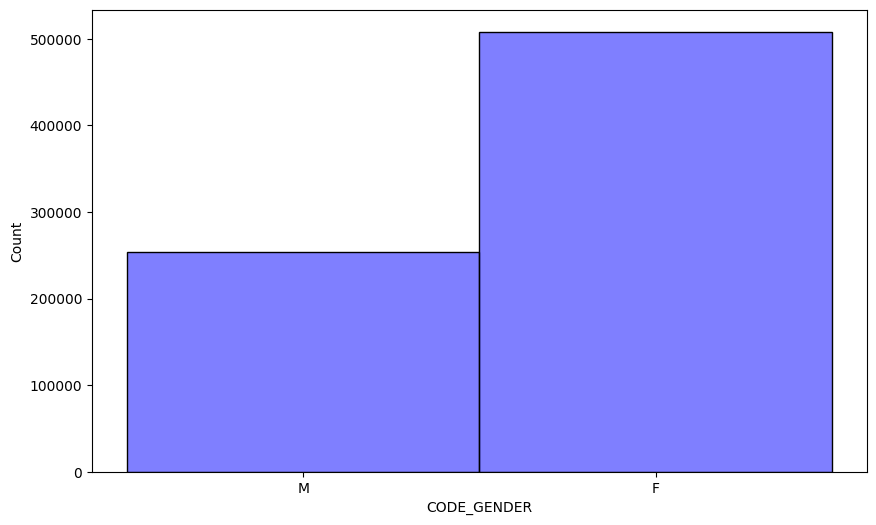

In [66]:
# distribution of the variable CODE_GENDER

plt.figure(figsize=(10,6))
sns.histplot(df_merged_copy['CODE_GENDER'], bins=50, color='blue', alpha=0.5)

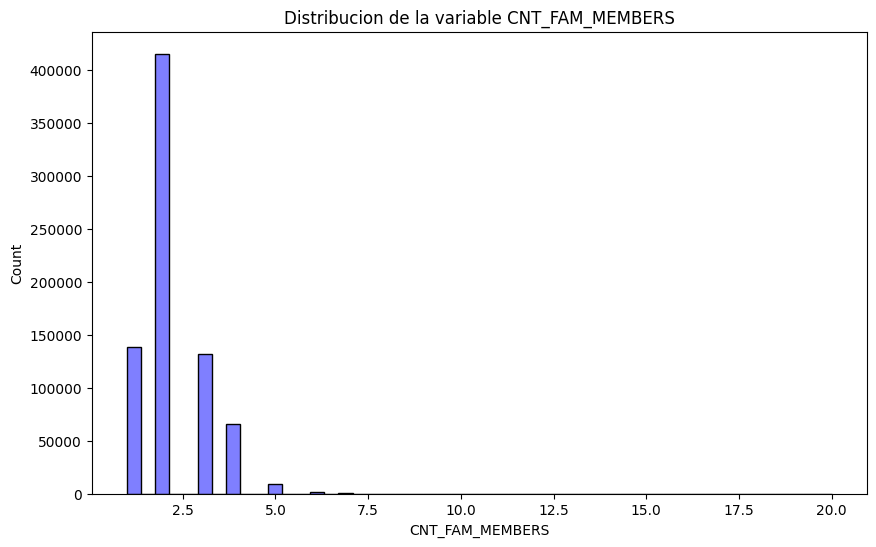

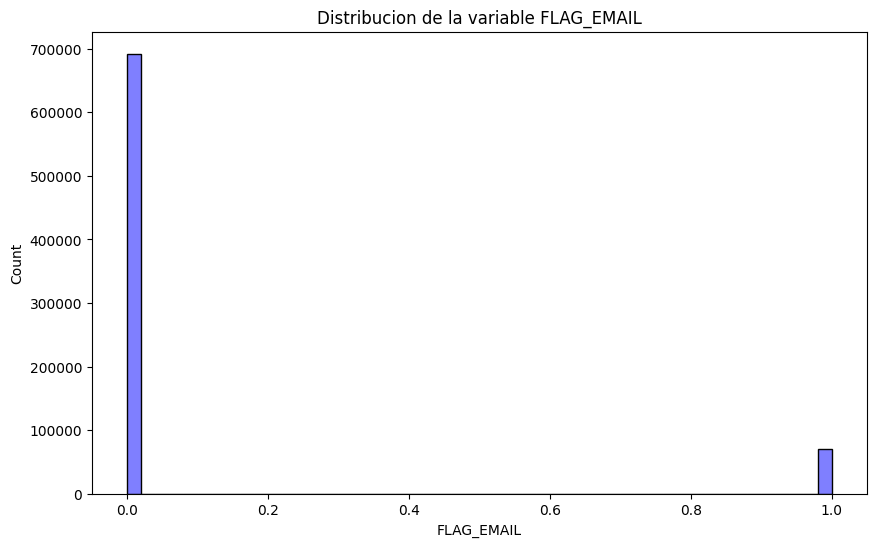

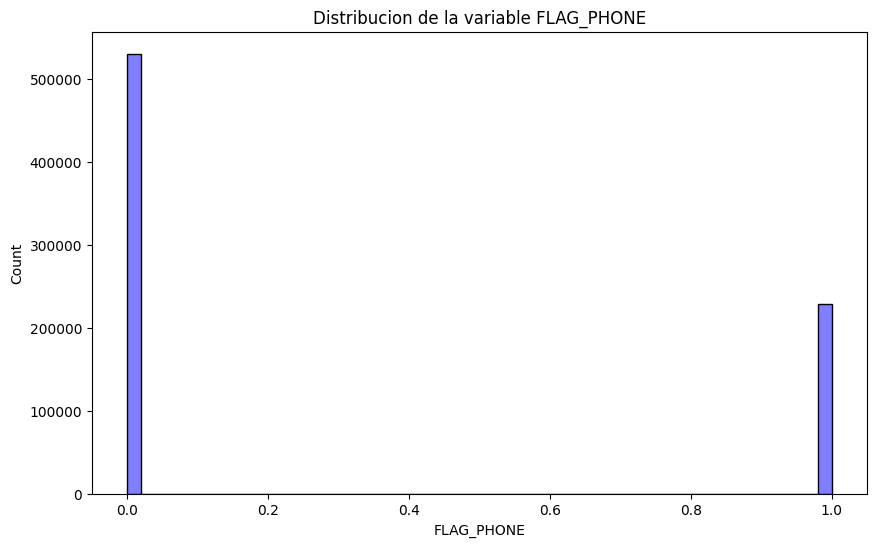

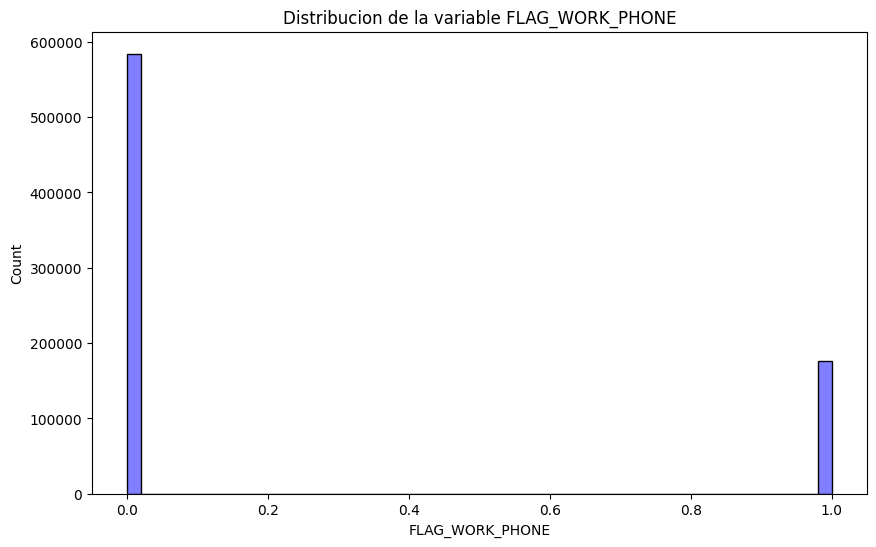

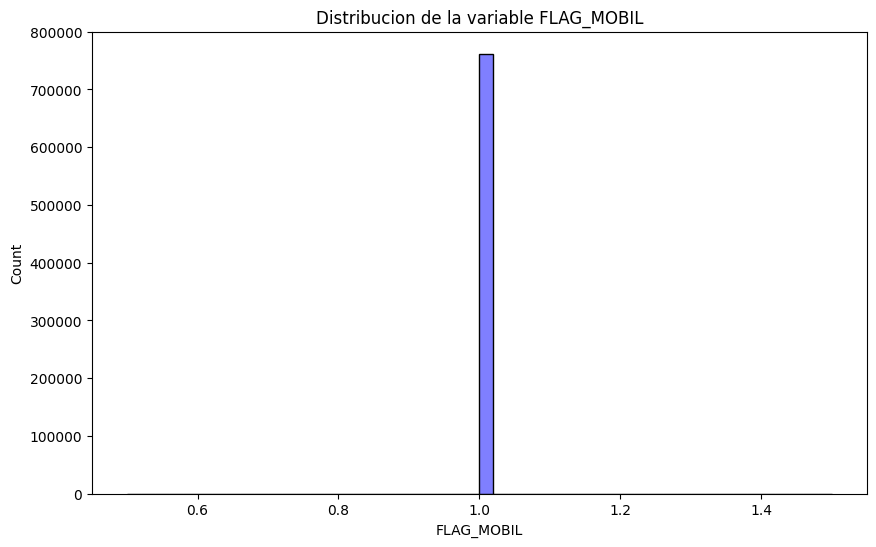

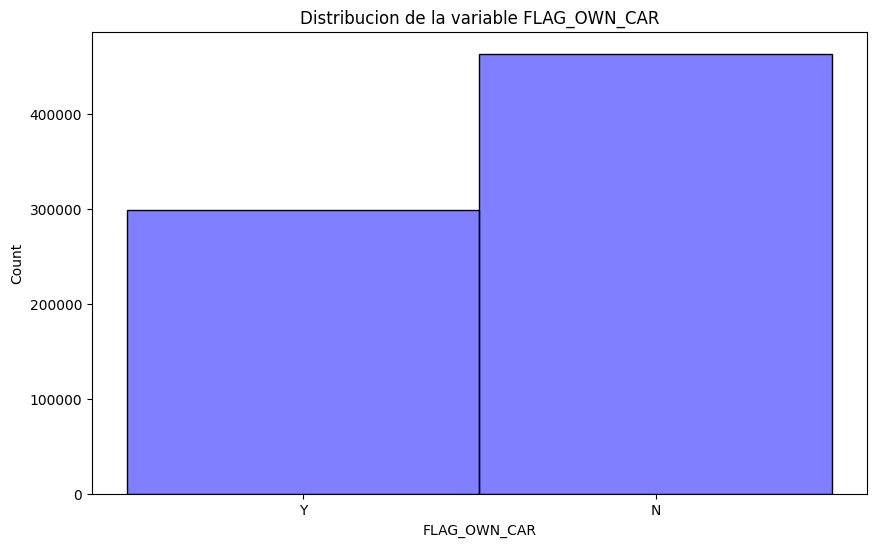

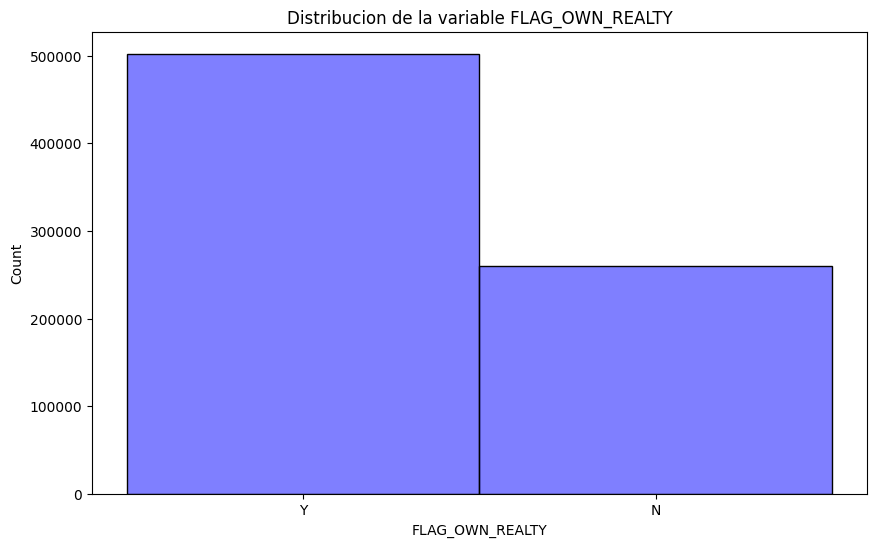

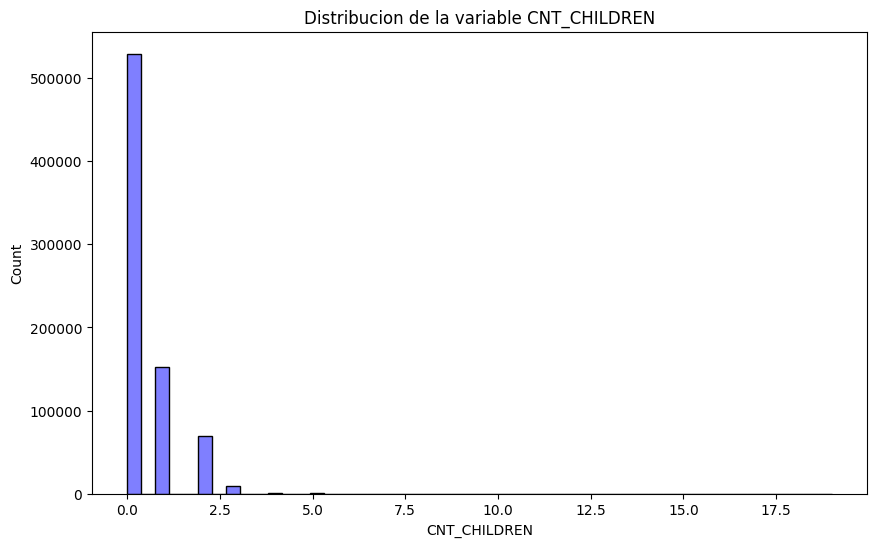

In [67]:
# before preprocessing numeric data distribution

for col in cols_int:
    plt.figure(figsize=(10,6))
    sns.histplot(df_merged_copy[col], bins=50, color='blue', alpha=0.5)
    plt.title(f'Distribucion de la variable {col}')
    plt.show()

### Variable normality

In [68]:
# checking for normality in the numeric columns using the Shapiro-Wilk test

no_norm_cols = []
for col in df_merged_copy.select_dtypes(include='number').columns:
    stat, p = shapiro(df_merged_copy[col])
    print(f'Variable: {col}, p-value: {p}')
    if p < 0.05:
        print(f'Variable {col} no sigue una distribucion normal')
        no_norm_cols.append(col)
    else:
        print(f'Variable {col} sigue una distribucion normal')



Variable: ID, p-value: 4.514413939602559e-143
Variable ID no sigue una distribucion normal
Variable: MONTHS_BALANCE, p-value: 1.4029409595472117e-136
Variable MONTHS_BALANCE no sigue una distribucion normal
Variable: CNT_CHILDREN, p-value: nan
Variable CNT_CHILDREN sigue una distribucion normal
Variable: AMT_INCOME_TOTAL, p-value: nan
Variable AMT_INCOME_TOTAL sigue una distribucion normal
Variable: DAYS_EMPLOYED, p-value: nan
Variable DAYS_EMPLOYED sigue una distribucion normal
Variable: FLAG_MOBIL, p-value: nan
Variable FLAG_MOBIL sigue una distribucion normal
Variable: FLAG_WORK_PHONE, p-value: nan
Variable FLAG_WORK_PHONE sigue una distribucion normal
Variable: FLAG_PHONE, p-value: nan
Variable FLAG_PHONE sigue una distribucion normal
Variable: FLAG_EMAIL, p-value: nan
Variable FLAG_EMAIL sigue una distribucion normal
Variable: CNT_FAM_MEMBERS, p-value: nan
Variable CNT_FAM_MEMBERS sigue una distribucion normal


c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\scipy\stats\_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 1051635.
  res = hypotest_fun_out(*samples, **kwds)


In [69]:
no_norm_cols

['ID', 'MONTHS_BALANCE']

### Outliers

<Axes: >

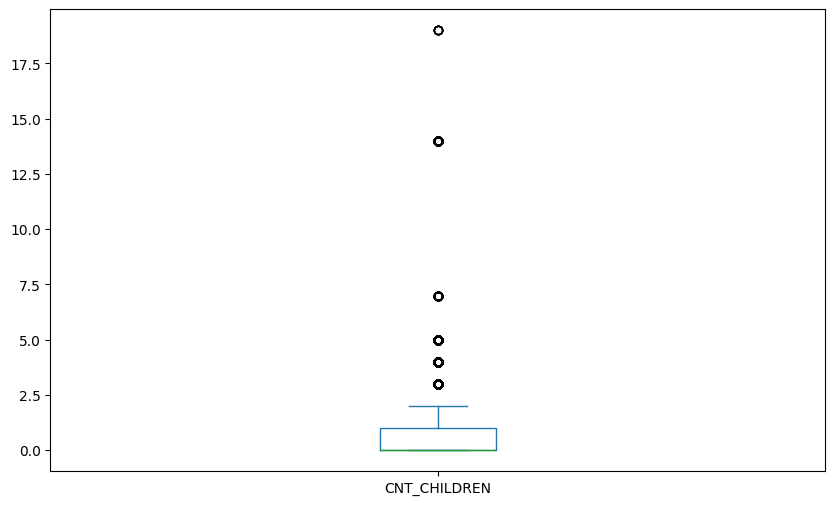

In [72]:
# visualizing outliers in the numeric columns using boxplots

df_merged_copy['CNT_CHILDREN'].plot(kind='box', figsize=(10,6))

<Axes: >

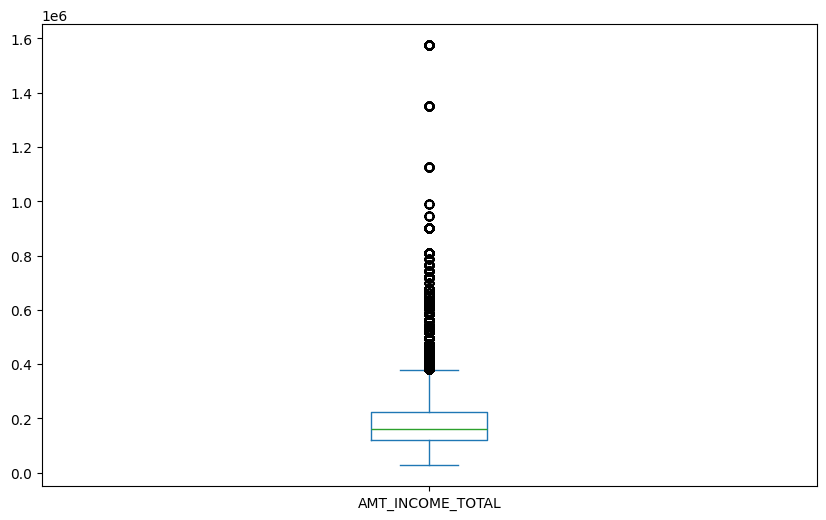

In [74]:
df_merged_copy['AMT_INCOME_TOTAL'].plot(kind='box', figsize=(10,6))

<Axes: >

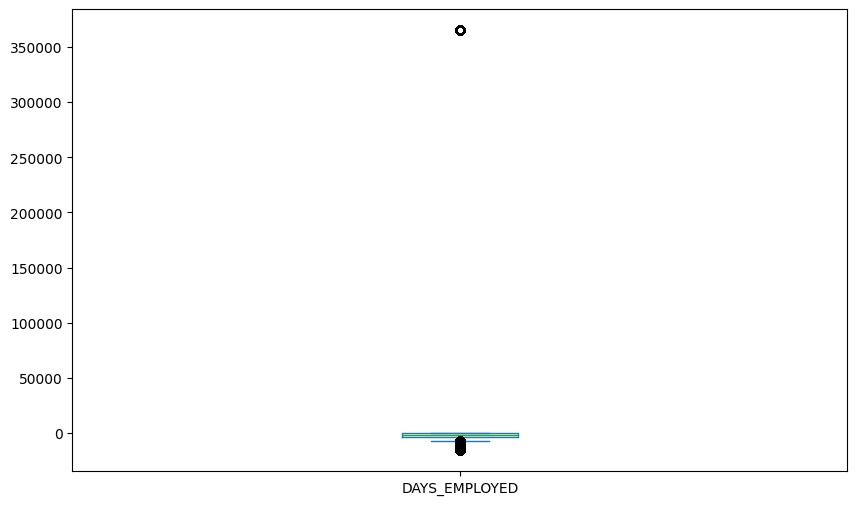

In [76]:
df_merged_copy['DAYS_EMPLOYED'].plot(kind='box', figsize=(10,6))

<Axes: >

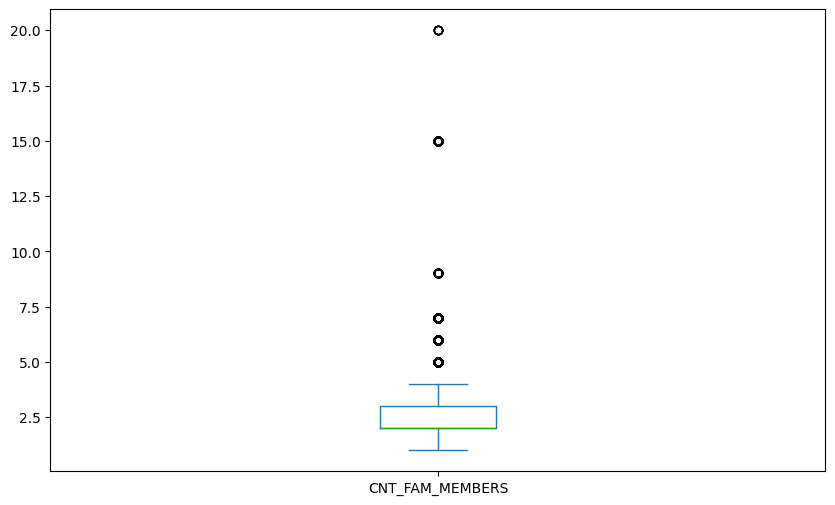

In [78]:
df_merged_copy['CNT_FAM_MEMBERS'].plot(kind='box', figsize=(10,6))

In [ ]:
# normal variables: treating outliers using ZSCORE method (3 standard deviations)

cols_outliers = ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_EMPLOYED', 'CNT_FAM_MEMBERS']
df_merged_copy_no_outliers = df_merged_copy.copy()
outliers_dict = {}

for col in cols_outliers:
    mean_col = df_merged_copy[col].mean()
    std_col = df_merged_copy[col].std()
    lower_bound = mean_col - 3 * std_col
    upper_bound = mean_col + 3 * std_col
    df_merged_copy_no_outliers = df_merged_copy_no_outliers[(df_merged_copy_no_outliers[col] > lower_bound) & (df_merged_copy_no_outliers[col] < upper_bound)]
    outliers_dict[f"{col}_outliers"] = df_merged_copy[(df_merged_copy[col] < lower_bound) | (df_merged_copy[col] > upper_bound)]
    print(f'Variable: {col}, lower bound: {lower_bound}, upper bound: {upper_bound}, outliers: {outliers_dict[f"{col}_outliers"].shape[0]}')

In [71]:
# checking for outliers in the dictionary

outliers_dict['CNT_CHILDREN_outliers'].sort_values('AMT_INCOME_TOTAL', ascending=True) 


,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,BIRTHDAY
946910,5135460,-9,X,F,N,Y,3.0,37800.0,Pensioner,Secondary / secondary special,Married,House / apartment,365243.0,1.0,0.0,0.0,0.0,NaN,5.0,05/07/1987,W,05/07/1987
946909,5135460,-8,X,F,N,Y,3.0,37800.0,Pensioner,Secondary / secondary special,Married,House / apartment,365243.0,1.0,0.0,0.0,0.0,NaN,5.0,05/07/1987,W,05/07/1987
946908,5135460,-7,X,F,N,Y,3.0,37800.0,Pensioner,Secondary / secondary special,Married,House / apartment,365243.0,1.0,0.0,0.0,0.0,NaN,5.0,05/07/1987,W,05/07/1987
946907,5135460,-6,0,F,N,Y,3.0,37800.0,Pensioner,Secondary / secondary special,Married,House / apartment,365243.0,1.0,0.0,0.0,0.0,NaN,5.0,05/07/1987,W,05/07/1987
946912,5135460,-11,0,F,N,Y,3.0,37800.0,Pensioner,Secondary / secondary special,Married,House / apartment,365243.0,1.0,0.0,0.0,0.0,NaN,5.0,05/07/1987,W,05/07/1987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1030413,5149051,-2,0,F,Y,Y,3.0,NaN,Commercial associate,NaN,Single / not married,Rented apartment,-1112.0,1.0,0.0,0.0,0.0,NaN,4.0,17/08/1959,Y,17/08/1959
1030414,5149051,-3,0,F,Y,Y,3.0,NaN,Commercial associate,NaN,Single / not married,Rented apartment,-1112.0,1.0,0.0,0.0,0.0,NaN,4.0,17/08/1959,Y,17/08/1959
1030415,5149051,-4,0,F,Y,Y,3.0,NaN,Commercial associate,NaN,Single / not married,Rented apartment,-1112.0,1.0,0.0,0.0,0.0,NaN,4.0,17/08/1959,Y,17/08/1959
1030416,5149051,-5,0,F,Y,Y,3.0,NaN,Commercial associate,NaN,Single / not married,Rented apartment,-1112.0,1.0,0.0,0.0,0.0,NaN,4.0,17/08/1959,Y,17/08/1959


In [73]:
outliers_dict['AMT_INCOME_TOTAL_outliers'].sort_values('AMT_INCOME_TOTAL', ascending=True)


,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,BIRTHDAY
1013639,5146108,-14,0,M,N,Y,3.0,494100.0,Commercial associate,Higher education,Married,House / apartment,-2104.0,1.0,0.0,0.0,0.0,Managers,5.0,15/11/1986,W,15/11/1986
1013640,5146108,-15,0,M,N,Y,3.0,494100.0,Commercial associate,Higher education,Married,House / apartment,-2104.0,1.0,0.0,0.0,0.0,Managers,5.0,15/11/1986,W,15/11/1986
1013641,5146108,-16,0,M,N,Y,3.0,494100.0,Commercial associate,Higher education,Married,House / apartment,-2104.0,1.0,0.0,0.0,0.0,Managers,5.0,15/11/1986,W,15/11/1986
1013642,5146108,-17,X,M,N,Y,3.0,494100.0,Commercial associate,Higher education,Married,House / apartment,-2104.0,1.0,0.0,0.0,0.0,Managers,5.0,15/11/1986,W,15/11/1986
1013643,5146109,-34,X,M,N,Y,3.0,494100.0,Commercial associate,Higher education,Married,NaN,-2104.0,1.0,0.0,0.0,0.0,Managers,5.0,15/11/1986,M,15/11/1986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999354,5143231,-8,C,F,NaN,Y,1.0,1575000.0,Commercial associate,Higher education,Single / not married,House / apartment,-2479.0,1.0,0.0,0.0,0.0,Managers,2.0,16/05/1995,N,16/05/1995
999353,5143231,-7,C,F,NaN,Y,1.0,1575000.0,Commercial associate,Higher education,Single / not married,House / apartment,-2479.0,1.0,0.0,0.0,0.0,Managers,2.0,16/05/1995,N,16/05/1995
999383,5143231,-37,1,F,NaN,Y,1.0,1575000.0,Commercial associate,Higher education,Single / not married,House / apartment,-2479.0,1.0,0.0,0.0,0.0,Managers,2.0,16/05/1995,N,16/05/1995
999382,5143231,-36,0,F,NaN,Y,1.0,1575000.0,Commercial associate,Higher education,Single / not married,House / apartment,-2479.0,1.0,0.0,0.0,0.0,Managers,2.0,16/05/1995,N,16/05/1995


In [75]:
outliers_dict['DAYS_EMPLOYED_outliers'].sort_values('AMT_INCOME_TOTAL', ascending=True)


,ID,MONTHS_BALANCE,STATUS,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,DAYS_BIRTH_CLEAN,Letter,BIRTHDAY


In [ ]:
outliers_dict['CNT_FAM_MEMBERS_outliers'].sort_values('AMT_INCOME_TOTAL', ascending=True)


### Variable distribution after treatment

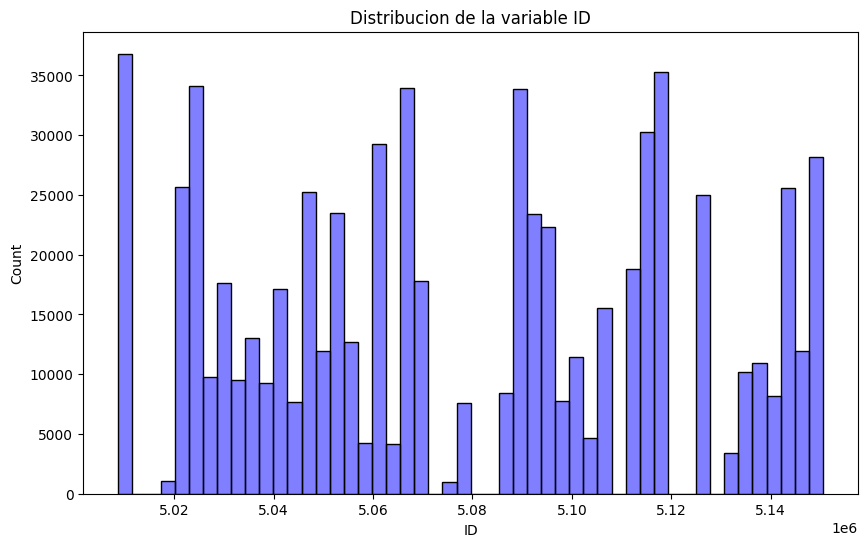

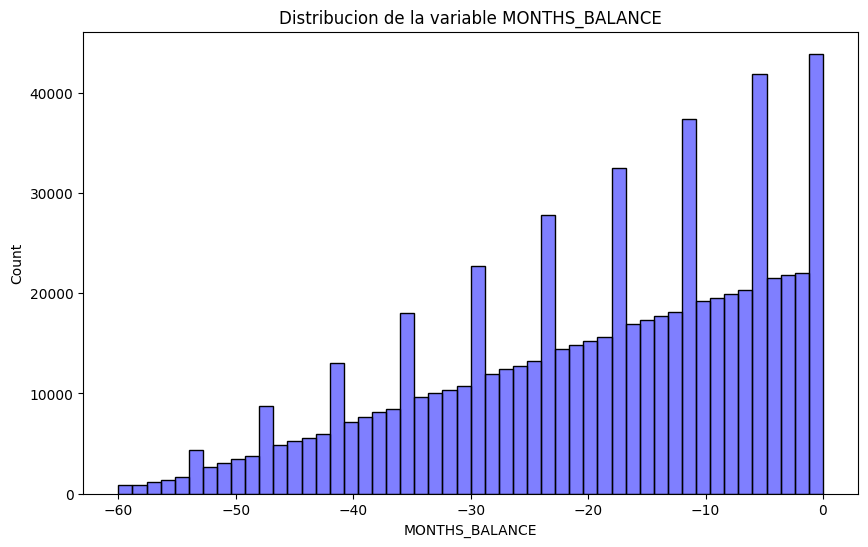

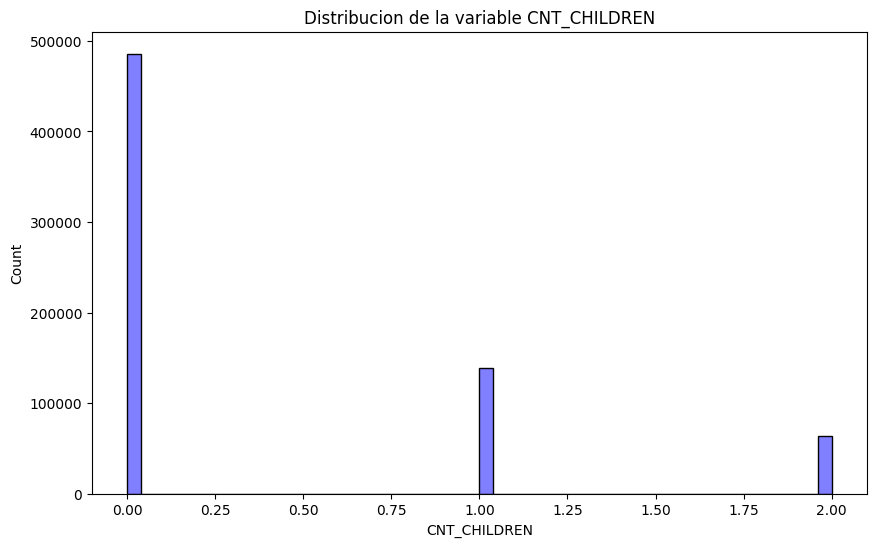

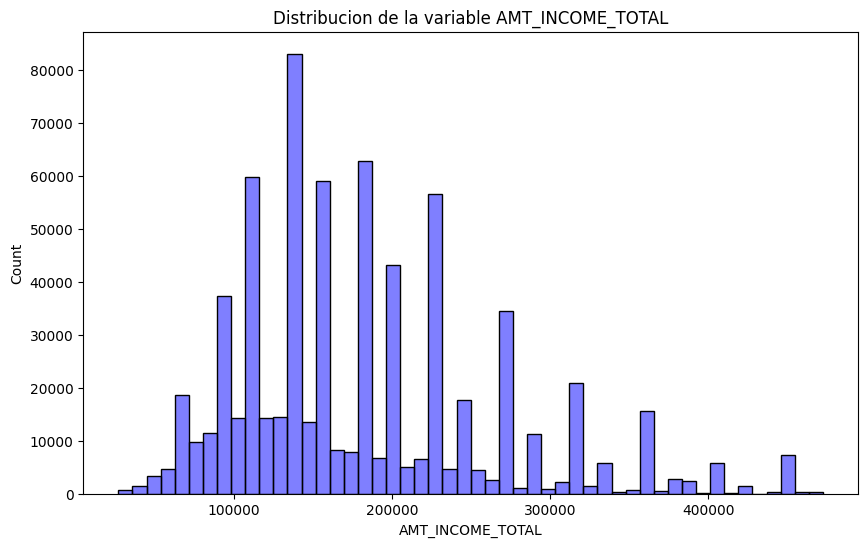

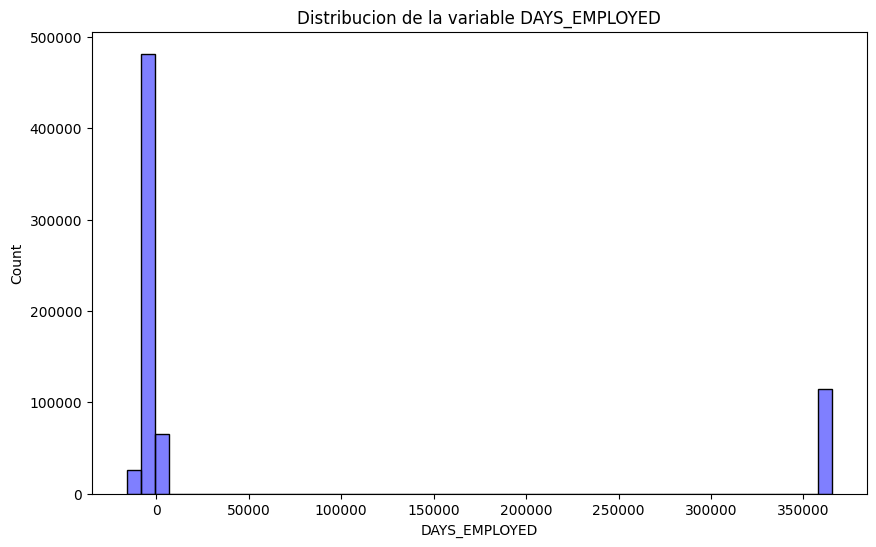

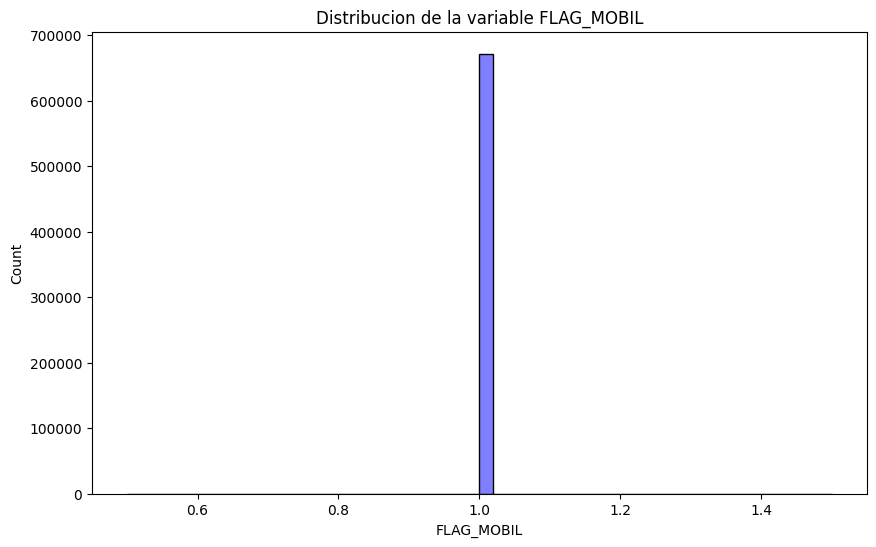

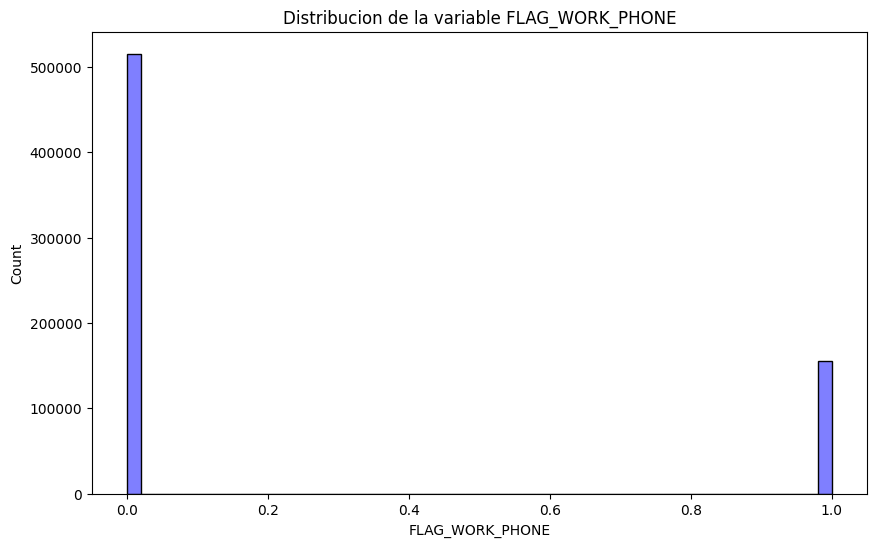

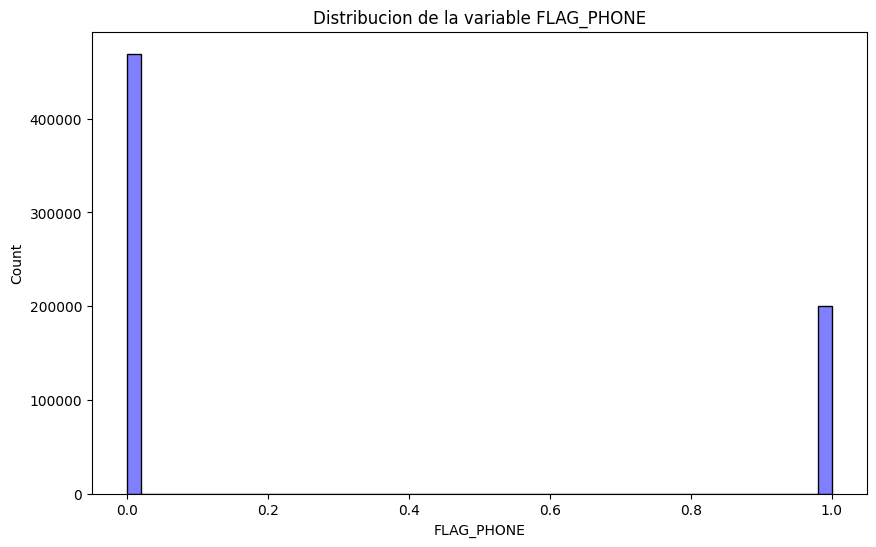

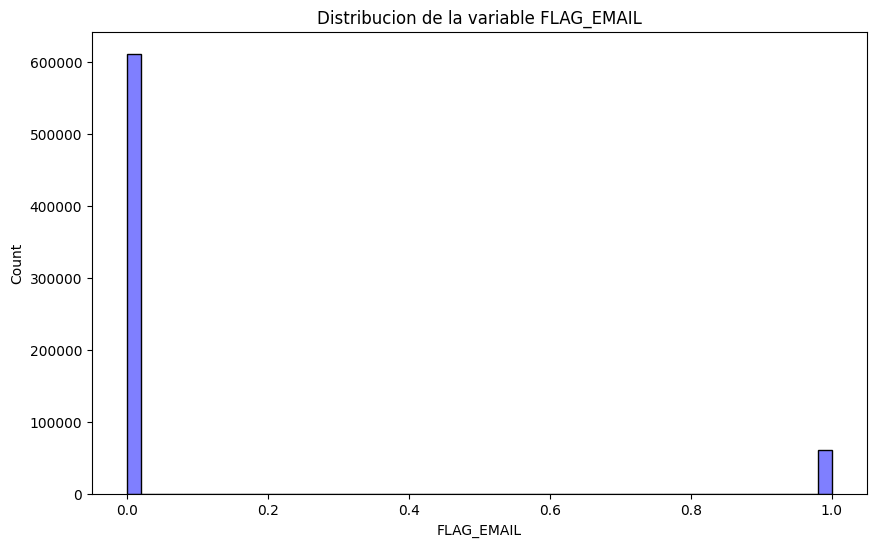

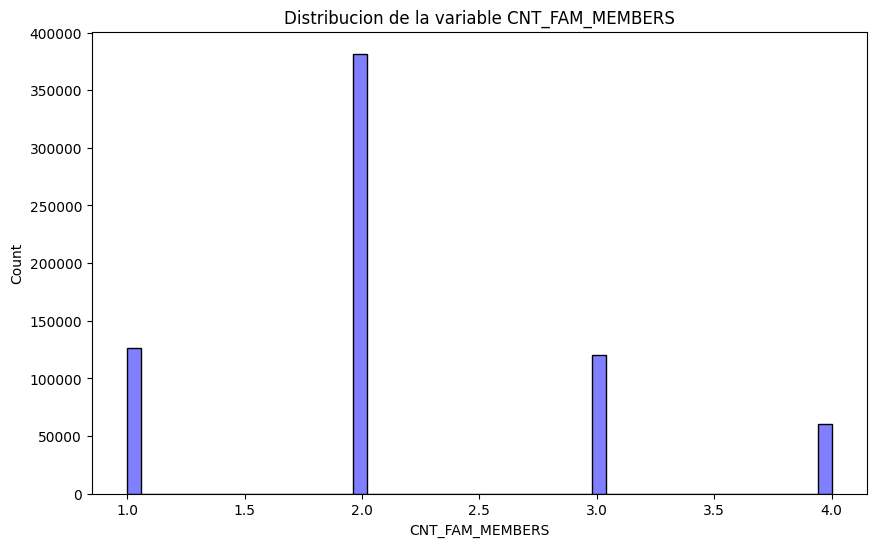

In [79]:

for col in df_merged_copy_no_outliers.select_dtypes(include='number').columns:
    plt.figure(figsize=(10,6))
    sns.histplot(df_merged_copy_no_outliers[col], bins=50, color='blue', alpha=0.5)
    plt.title(f'Distribucion de la variable {col}')
    plt.show()

### Missing values

Now that we have no outliers, let's check for missing values.

In [80]:


df_merged_copy_no_outliers.isnull().sum()

ID                          0
MONTHS_BALANCE              0
STATUS                      0
CODE_GENDER             16929
FLAG_OWN_CAR            16900
FLAG_OWN_REALTY         16721
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE        17628
NAME_EDUCATION_TYPE     17824
NAME_FAMILY_STATUS      16633
NAME_HOUSING_TYPE       16932
DAYS_EMPLOYED               0
FLAG_MOBIL              16888
FLAG_WORK_PHONE         17714
FLAG_PHONE              18325
FLAG_EMAIL              16588
OCCUPATION_TYPE        223138
CNT_FAM_MEMBERS             0
DAYS_BIRTH_CLEAN        15692
Letter                      0
BIRTHDAY                15692
dtype: int64

In [81]:
df_no_out_imputation = df_merged_copy_no_outliers.copy() # copy of the df without outliers for imputation

In [82]:
df_impu_numeric = df_no_out_imputation.select_dtypes(include='number')
df_impu_categorical = df_no_out_imputation.select_dtypes(include='object')

In [83]:
df_impu_numeric.isnull().sum()

ID                      0
MONTHS_BALANCE          0
CNT_CHILDREN            0
AMT_INCOME_TOTAL        0
DAYS_EMPLOYED           0
FLAG_MOBIL          16888
FLAG_WORK_PHONE     17714
FLAG_PHONE          18325
FLAG_EMAIL          16588
CNT_FAM_MEMBERS         0
dtype: int64

In [84]:
df_impu_numeric_cols = df_impu_numeric.columns[df_impu_numeric.isnull().any()]
df_impu_numeric = df_impu_numeric[df_impu_numeric_cols]

In [85]:
df_impu_numeric

,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL
92938,1.0,1.0,0.0,0.0
92939,1.0,0.0,0.0,0.0
92940,1.0,1.0,0.0,0.0
92941,1.0,0.0,0.0,0.0
92942,1.0,1.0,0.0,0.0
...,...,...,...,...
1051630,1.0,0.0,0.0,0.0
1051631,1.0,0.0,0.0,0.0
1051632,1.0,0.0,0.0,0.0
1051633,1.0,0.0,0.0,0.0


In [86]:
df_impu_categorical.isnull().sum()

STATUS                      0
CODE_GENDER             16929
FLAG_OWN_CAR            16900
FLAG_OWN_REALTY         16721
NAME_INCOME_TYPE        17628
NAME_EDUCATION_TYPE     17824
NAME_FAMILY_STATUS      16633
NAME_HOUSING_TYPE       16932
OCCUPATION_TYPE        223138
DAYS_BIRTH_CLEAN        15692
Letter                      0
BIRTHDAY                15692
dtype: int64

In [87]:
df_impu_categorical_cols = df_impu_categorical.columns[df_impu_categorical.isnull().any()]
df_impu_categorical = df_impu_categorical[df_impu_categorical_cols]

In [88]:
df_impu_categorical

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,DAYS_BIRTH_CLEAN,BIRTHDAY
92938,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,NaN,09/04/1990,09/04/1990
92939,F,N,Y,State servant,Secondary / secondary special,Married,House / apartment,Medicine staff,07/06/1984,07/06/1984
92940,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,NaN,09/04/1990,09/04/1990
92941,F,N,Y,State servant,Secondary / secondary special,Married,House / apartment,Medicine staff,07/06/1984,07/06/1984
92942,M,Y,Y,Working,Higher education,Civil marriage,Rented apartment,NaN,09/04/1990,09/04/1990
...,...,...,...,...,...,...,...,...,...,...
1051630,M,Y,N,Working,Secondary / secondary special,Married,NaN,Drivers,NaN,NaN
1051631,M,Y,N,Working,Secondary / secondary special,Married,NaN,Drivers,NaN,NaN
1051632,M,Y,N,Working,Secondary / secondary special,Married,NaN,Drivers,NaN,NaN
1051633,M,Y,N,Working,Secondary / secondary special,Married,NaN,Drivers,NaN,NaN


#### Numeric variables

In [ ]:
# imputing missing values in the numeric columns using KNNImputer

imputer = KNNImputer(n_neighbors=3) 
df_imputed = pd.DataFrame(imputer.fit_transform(df_impu_numeric), columns=df_impu_numeric.columns)


#### Categorical variables

In [90]:
df_impu_categorical.drop(columns=['DAYS_BIRTH_CLEAN', 'BIRTHDAY'], inplace=True)

In [91]:
df_impu_categorical.columns

Index(['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'OCCUPATION_TYPE'],
      dtype='object')

In [92]:
# encoding categorical variables using label encoding

label_encoder = LabelEncoder()
for col in df_impu_categorical.columns:
    df_impu_categorical[col] = label_encoder.fit_transform(df_impu_categorical[col])

df_impu_categorical

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE
92938,1,1,1,4,1,0,4,18
92939,0,0,1,2,4,1,1,11
92940,1,1,1,4,1,0,4,18
92941,0,0,1,2,4,1,1,11
92942,1,1,1,4,1,0,4,18
...,...,...,...,...,...,...,...,...
1051630,1,1,0,4,4,1,6,4
1051631,1,1,0,4,4,1,6,4
1051632,1,1,0,4,4,1,6,4
1051633,1,1,0,4,4,1,6,4


In [ ]:
imputer_cat = KNNImputer(n_neighbors=3)
df_imputed_cat = pd.DataFrame(imputer_cat.fit_transform(df_impu_categorical), columns=df_impu_categorical.columns)

#### Merging tables

In [ ]:
df_imputed = pd.concat([df_imputed, df_imputed_cat], axis=1)


In [95]:
df_imputed.head()

,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE
0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
1,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0,1.0,1.0,11.0
2,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
3,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0,1.0,1.0,11.0
4,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0


In [96]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 688417 entries, 0 to 688416
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   FLAG_MOBIL           688417 non-null  float64
 1   FLAG_WORK_PHONE      688417 non-null  float64
 2   FLAG_PHONE           688417 non-null  float64
 3   FLAG_EMAIL           688417 non-null  float64
 4   CODE_GENDER          688417 non-null  float64
 5   FLAG_OWN_CAR         688417 non-null  float64
 6   FLAG_OWN_REALTY      688417 non-null  float64
 7   NAME_INCOME_TYPE     688417 non-null  float64
 8   NAME_EDUCATION_TYPE  688417 non-null  float64
 9   NAME_FAMILY_STATUS   688417 non-null  float64
 10  NAME_HOUSING_TYPE    688417 non-null  float64
 11  OCCUPATION_TYPE      688417 non-null  float64
dtypes: float64(12)
memory usage: 63.0 MB


In [97]:
df_merged_copy_no_outliers.isnull().sum() # checking for no missing values in the original df

ID                          0
MONTHS_BALANCE              0
STATUS                      0
CODE_GENDER             16929
FLAG_OWN_CAR            16900
FLAG_OWN_REALTY         16721
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE        17628
NAME_EDUCATION_TYPE     17824
NAME_FAMILY_STATUS      16633
NAME_HOUSING_TYPE       16932
DAYS_EMPLOYED               0
FLAG_MOBIL              16888
FLAG_WORK_PHONE         17714
FLAG_PHONE              18325
FLAG_EMAIL              16588
OCCUPATION_TYPE        223138
CNT_FAM_MEMBERS             0
DAYS_BIRTH_CLEAN        15692
Letter                      0
BIRTHDAY                15692
dtype: int64

In [98]:
# keeping only the columns without missing values

columns_without_nans = df_merged_copy_no_outliers.columns[df_merged_copy_no_outliers.isnull().sum() == 0]

In [99]:
df_no_nans = df_merged_copy_no_outliers[columns_without_nans]

In [100]:
df_imputed

,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE
0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
1,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0,1.0,1.0,11.0
2,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
3,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0,1.0,1.0,11.0
4,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...
688412,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0
688413,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0
688414,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0
688415,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0


In [101]:
df_no_nans

,ID,MONTHS_BALANCE,STATUS,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_EMPLOYED,CNT_FAM_MEMBERS,Letter
92938,5008804,0,C,0.0,427500.0,-4542.0,2.0,L
92939,5008804,0,C,1.0,90000.0,-3659.0,3.0,L
92940,5008804,-1,C,0.0,427500.0,-4542.0,2.0,L
92941,5008804,-1,C,1.0,90000.0,-3659.0,3.0,L
92942,5008804,-2,C,0.0,427500.0,-4542.0,2.0,L
...,...,...,...,...,...,...,...,...
1051630,5150487,-25,C,0.0,202500.0,-2166.0,2.0,Q
1051631,5150487,-26,C,0.0,202500.0,-2166.0,2.0,Q
1051632,5150487,-27,C,0.0,202500.0,-2166.0,2.0,Q
1051633,5150487,-28,C,0.0,202500.0,-2166.0,2.0,Q


In [102]:
df_merged_imputed = pd.concat([df_no_nans.reset_index(), df_imputed.reset_index()], axis=1) # concatenating the dataframes to get all data together

In [103]:
df_merged_imputed.isnull().sum() # there are no missing values

index                  0
ID                     0
MONTHS_BALANCE         0
STATUS                 0
CNT_CHILDREN           0
AMT_INCOME_TOTAL       0
DAYS_EMPLOYED          0
CNT_FAM_MEMBERS        0
Letter                 0
index                  0
FLAG_MOBIL             0
FLAG_WORK_PHONE        0
FLAG_PHONE             0
FLAG_EMAIL             0
CODE_GENDER            0
FLAG_OWN_CAR           0
FLAG_OWN_REALTY        0
NAME_INCOME_TYPE       0
NAME_EDUCATION_TYPE    0
NAME_FAMILY_STATUS     0
NAME_HOUSING_TYPE      0
OCCUPATION_TYPE        0
dtype: int64

In [172]:
df_complete_no_nan_no_out = df_merged_imputed.copy()

In [ ]:
# saving the dataframe with no outliers and no missing values to a csv file

df_complete_no_nan_no_out.to_csv('df_complete_no_nan_no_out.csv', index=False)

## 3) Data analysis and visualization

### Visualization

In [105]:
df_complete_no_nan_no_out.iloc[:, 2:]

,MONTHS_BALANCE,STATUS,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_EMPLOYED,CNT_FAM_MEMBERS,Letter,index,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE
0,0,C,0.0,427500.0,-4542.0,2.0,L,0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
1,0,C,1.0,90000.0,-3659.0,3.0,L,1,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0,1.0,1.0,11.0
2,-1,C,0.0,427500.0,-4542.0,2.0,L,2,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
3,-1,C,1.0,90000.0,-3659.0,3.0,L,3,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,4.0,1.0,1.0,11.0
4,-2,C,0.0,427500.0,-4542.0,2.0,L,4,1.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,1.0,0.0,4.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
688412,-25,C,0.0,202500.0,-2166.0,2.0,Q,688412,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0
688413,-26,C,0.0,202500.0,-2166.0,2.0,Q,688413,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0
688414,-27,C,0.0,202500.0,-2166.0,2.0,Q,688414,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0
688415,-28,C,0.0,202500.0,-2166.0,2.0,Q,688415,1.0,0.0,0.0,0.0,1.0,1.0,0.0,4.0,4.0,1.0,6.0,4.0


In [ ]:
# distributions after data preprocessing (without outiers, with missing values)

for i, col in enumerate(df_merged_copy_no_outliers.iloc[:,2:].columns):
    if i*2+1 < len(df_merged_copy_no_outliers.columns):
        col1 = df_merged_copy_no_outliers.columns[i*2]
        col2 = df_merged_copy_no_outliers.columns[i*2+1]
        
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        sns.histplot(df_merged_copy_no_outliers[col1], bins=50, color='blue', alpha=0.5)
        plt.xticks(rotation=45) 
        plt.title(f'Distribución de la variable {col1}')

        plt.subplot(1, 2, 2)
        sns.histplot(df_merged_copy_no_outliers[col2], bins=50, color='green', alpha=0.5)
        plt.xticks(rotation=45) 
        plt.title(f'Distribución de la variable {col2}')

        plt.tight_layout()
        plt.show()

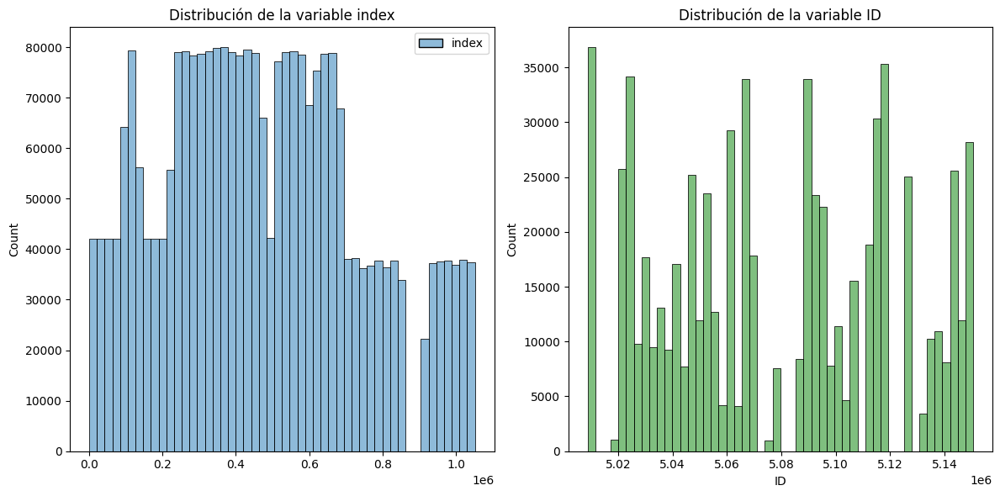

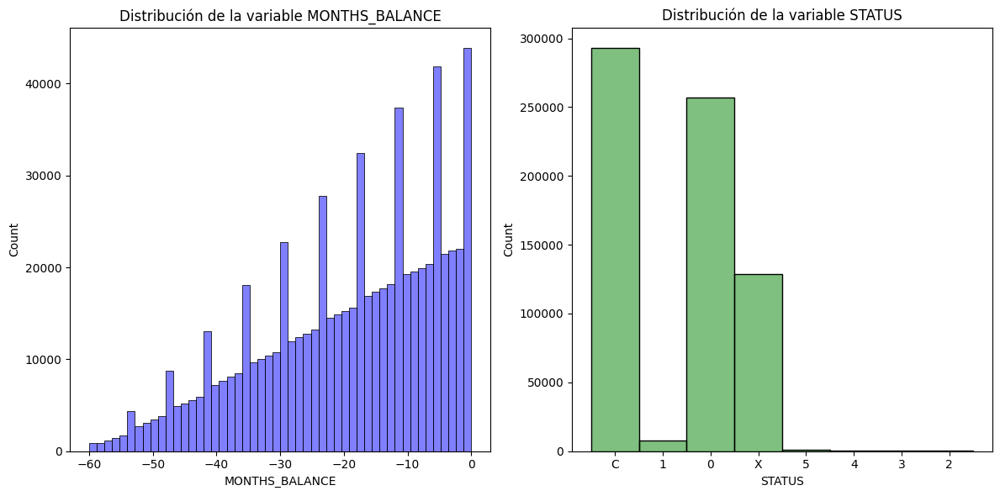

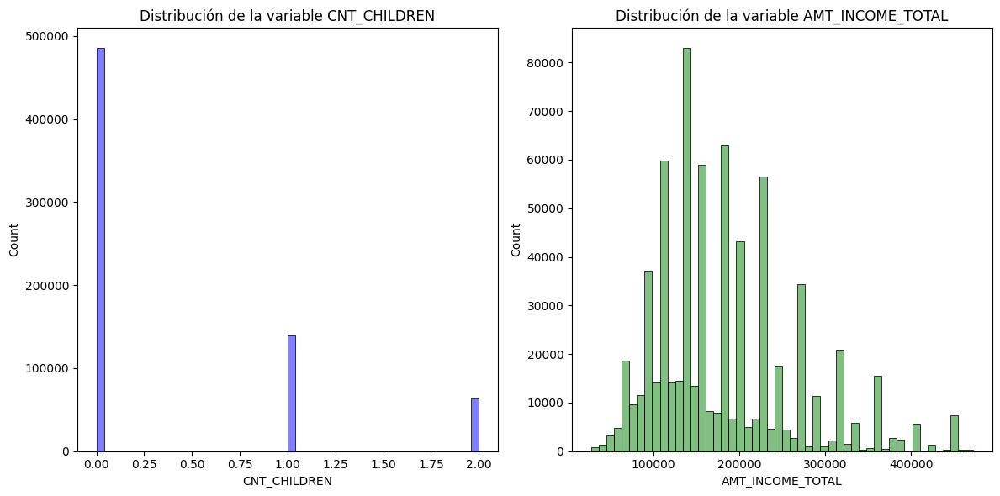

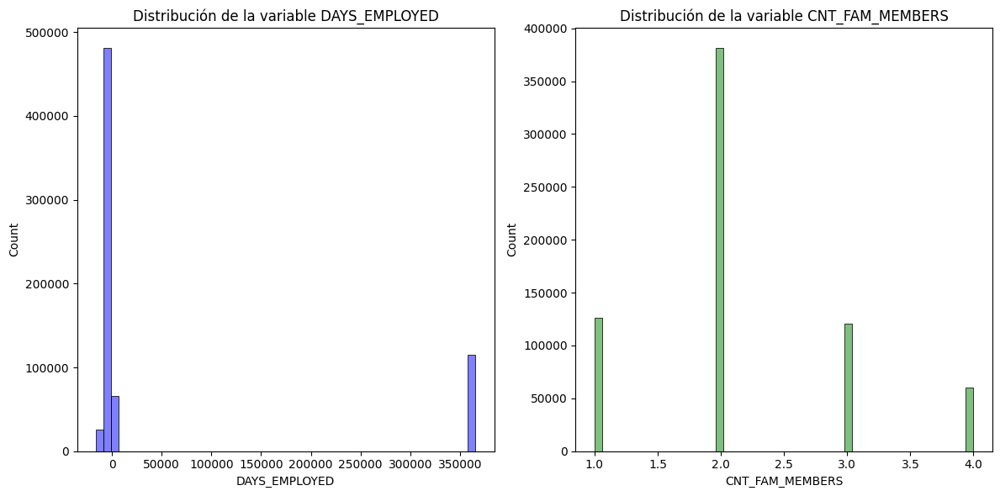

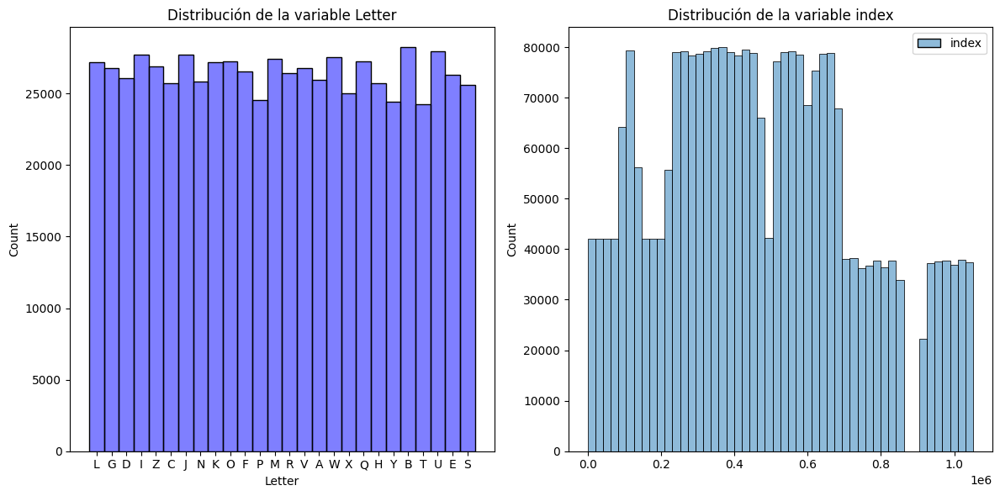

...

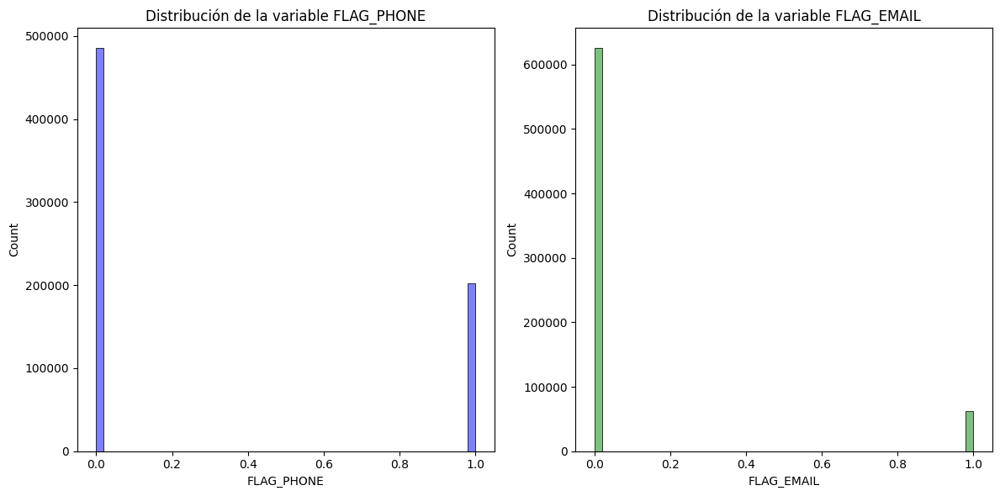

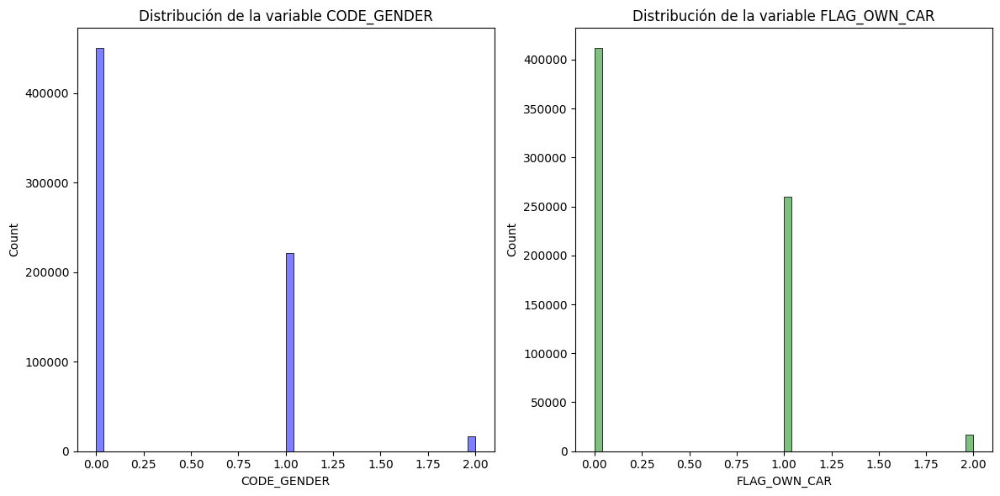

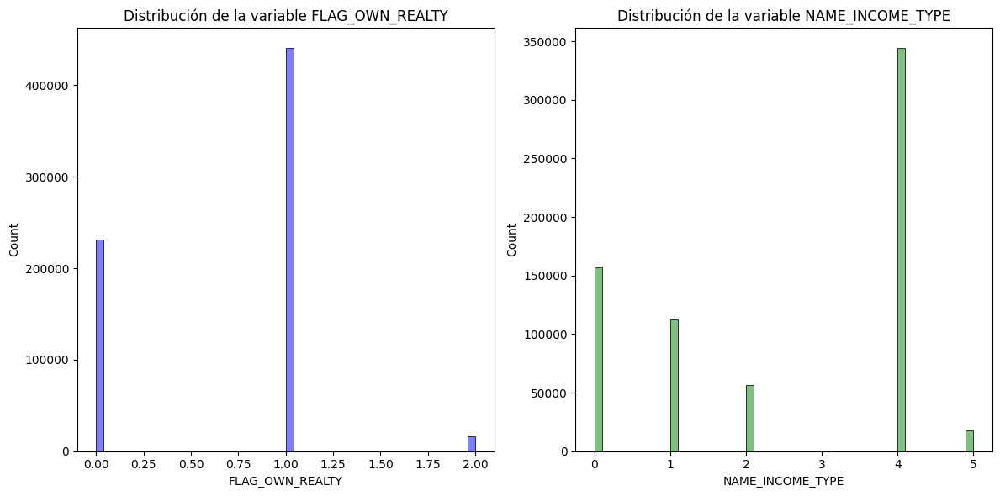

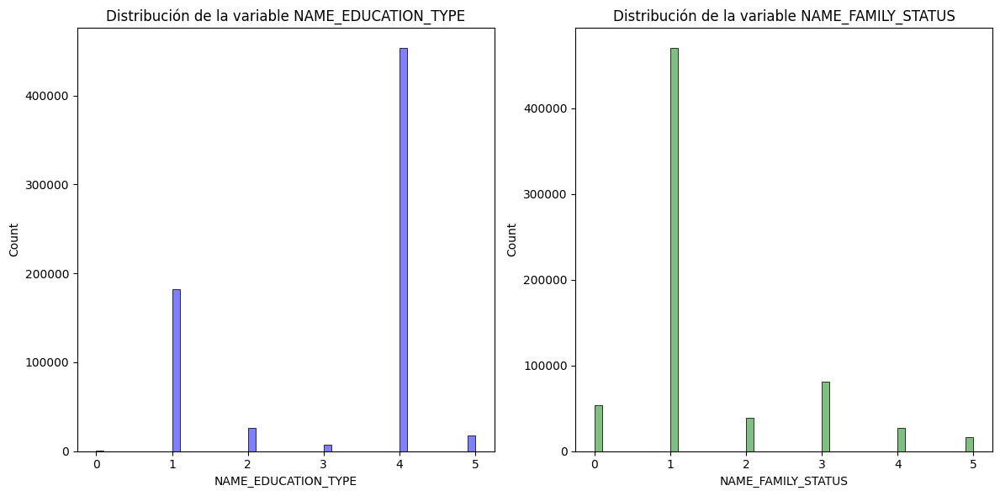

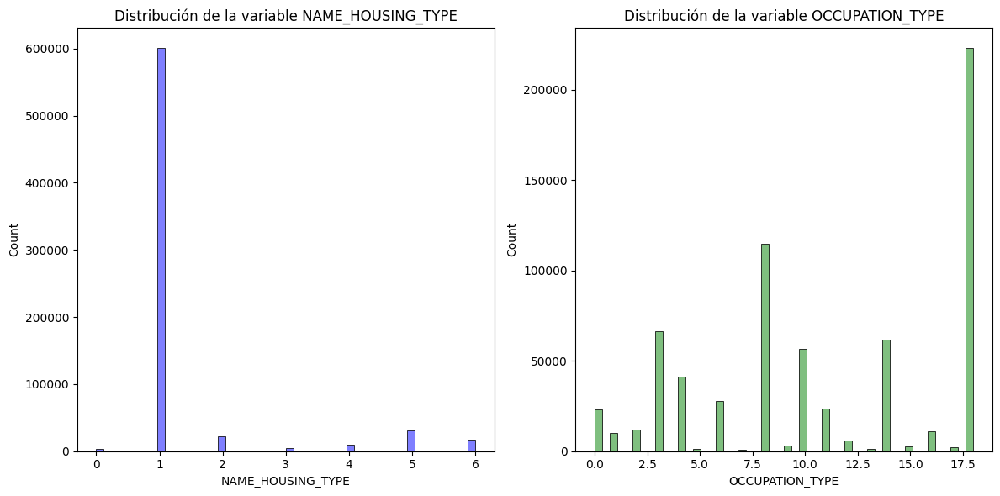

In [106]:
# distributions after data processing (without outliers and missing values)

for i, col in enumerate(df_complete_no_nan_no_out.iloc[:,2:].columns):
    if i*2+1 < len(df_complete_no_nan_no_out.columns):
        col1 = df_complete_no_nan_no_out.columns[i*2]
        col2 = df_complete_no_nan_no_out.columns[i*2+1]
        
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        sns.histplot(df_complete_no_nan_no_out[col1], bins=50, color='blue', alpha=0.5)
        plt.title(f'Distribución de la variable {col1}')

        plt.subplot(1, 2, 2)
        sns.histplot(df_complete_no_nan_no_out[col2], bins=50, color='green', alpha=0.5)
        plt.title(f'Distribución de la variable {col2}')

        plt.tight_layout()
        plt.show()

**Key Takeaways**:

- Consistency: The overall patterns in the data remain consistent before and after preprocessing, which is a good indication that the preprocessing steps were effective in cleaning the data without distorting the underlying distributions.

- Outliers and Missing Values: The presence of outliers and missing values can significantly affect the distribution and analysis of the data. Cleaning these data points is crucial for accurate model training and performance.

- Data Skewness: Both income and employment data show significant skewness, which might require further transformation or scaling for improved model performance (depends on the kind of modelling).

- Dominant Categories: Variables like STATUS, CNT_CHILDREN, and CNT_FAM_MEMBERS have dominant categories, which could influence the modeling outcomes and should be carefully considered during feature engineering and model training.

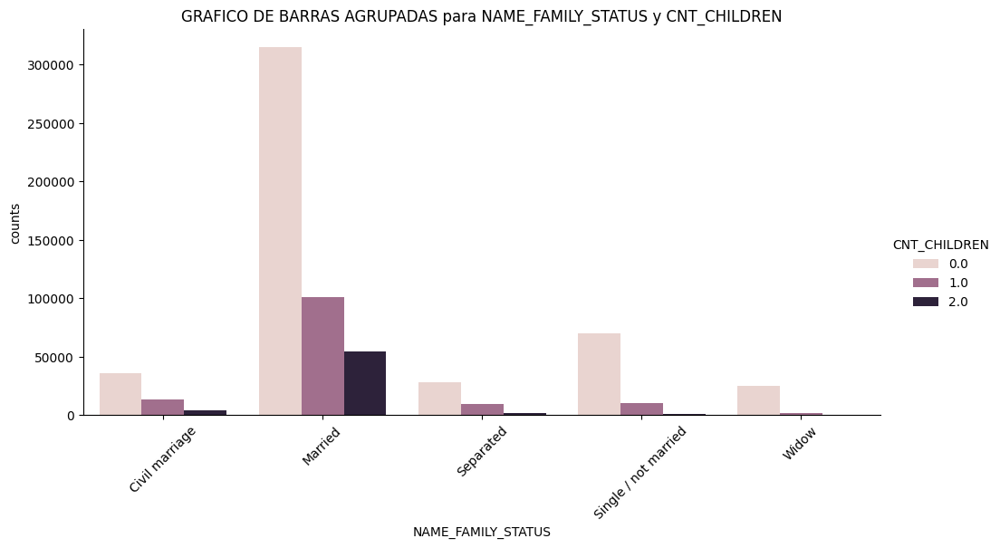

In [115]:
data_barras = df_merged_copy_no_outliers.groupby(['NAME_FAMILY_STATUS', 'CNT_CHILDREN']).size().reset_index(name='counts')

sns.catplot(data=data_barras, kind='bar', x='NAME_FAMILY_STATUS', y='counts', hue='CNT_CHILDREN', height=5, aspect=2)
plt.title('GRAFICO DE BARRAS AGRUPADAS para NAME_FAMILY_STATUS y CNT_CHILDREN')
plt.xticks(rotation=45) 
plt.show()

The proportion of people without children is higher in all NAME_FAMILY_STATUS categories.
However, in the Married category, a considerable number of people with 1 and 2 children are observed, suggesting that marriage is associated with a higher probability of having children.

The overall trend shows that the majority of potential clients do not have children, which may influence segmentation strategies and product offerings by the insurer.

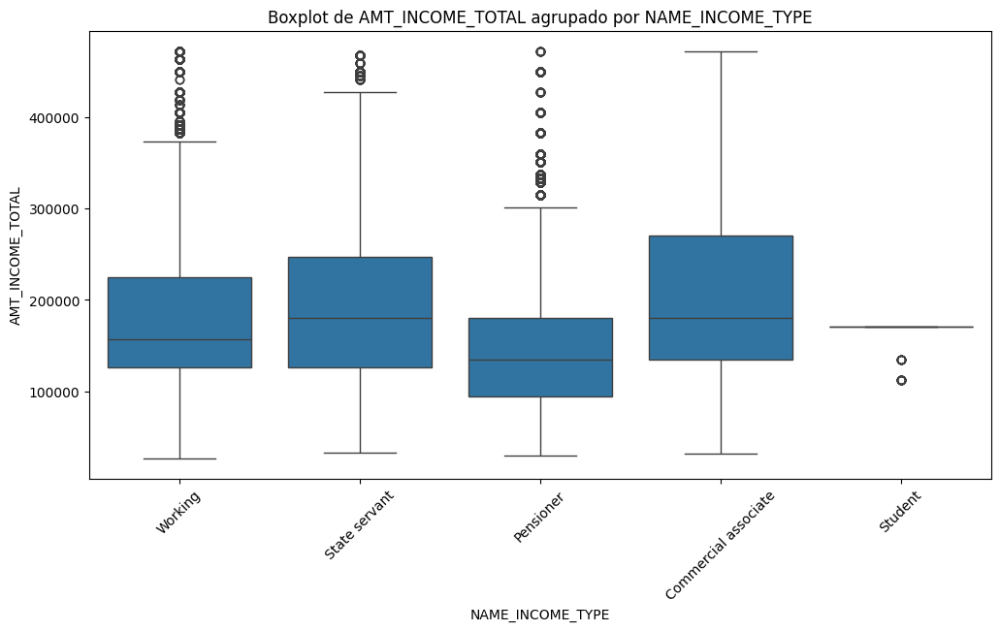

In [116]:

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_merged_copy_no_outliers, x='NAME_INCOME_TYPE', y='AMT_INCOME_TOTAL')
plt.title('Boxplot de AMT_INCOME_TOTAL agrupado por NAME_INCOME_TYPE')
plt.xticks(rotation=45)
plt.show()

This boxplot provides a clear visual representation of income distribution across different income types, highlighting the disparities and variability within each group. It underscores the importance of targeted financial policies and interventions tailored to the specific needs and characteristics of each group.

The higher income variability and the presence of outliers in the working, state servant, and commercial associate groups, policies targeting income support might need to be more flexible and adaptive to accommodate the diverse income levels and financial situations within these groups.

For pensioners and students, specific financial aid or support programs might be more straightforward due to their lower and more uniform income levels, ensuring that the aid reaches those who need it most without much internal disparity.

([0, 1], [Text(0, 0, 'N'), Text(1, 0, 'Y')])

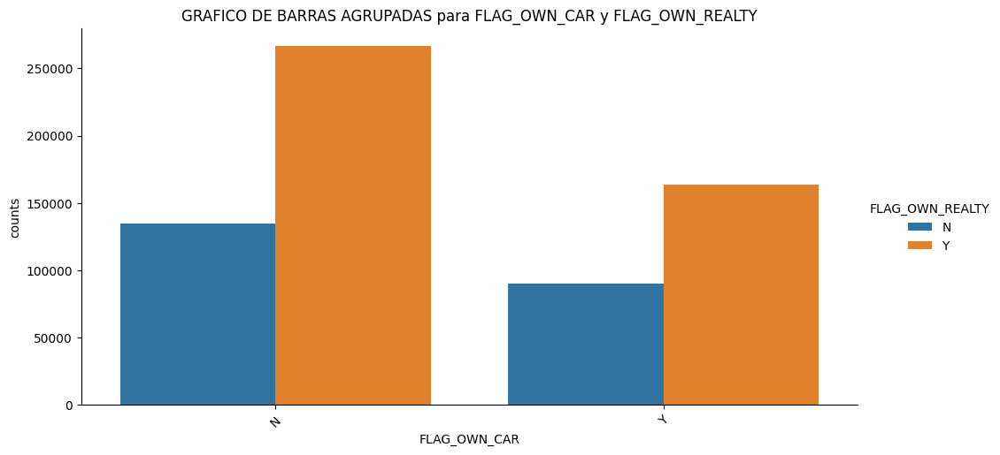

In [117]:

data_barras = df_merged_copy_no_outliers.groupby(['FLAG_OWN_CAR', 'FLAG_OWN_REALTY']).size().reset_index(name='counts')
sns.catplot(data=data_barras, kind='bar', x='FLAG_OWN_CAR', y='counts', hue='FLAG_OWN_REALTY', height=5, aspect=2)
plt.title('GRAFICO DE BARRAS AGRUPADAS para FLAG_OWN_CAR y FLAG_OWN_REALTY')
plt.xticks(rotation=45)

In [120]:

df_merged_copy_no_outliers.groupby('OCCUPATION_TYPE').agg({'AMT_INCOME_TOTAL':'mean', 'DAYS_EMPLOYED':'mean', 'CNT_FAM_MEMBERS':'mean'}).reset_index()

,OCCUPATION_TYPE,AMT_INCOME_TOTAL,DAYS_EMPLOYED,CNT_FAM_MEMBERS
0,Accountants,193966.679686,-2669.946951,2.197605
1,Cleaning staff,149258.299980,-2623.923854,1.917651
2,Cooking staff,143394.012051,-2506.897983,2.167462
3,Core staff,187471.769813,-3025.364550,2.296531
4,Drivers,205704.594259,-2059.893434,2.384681
5,HR staff,169148.891967,-2177.673823,1.854571
6,High skill tech staff,193226.616566,-3349.574467,2.258110
7,IT staff,195223.943662,-1490.338028,2.147887
8,Laborers,179886.438465,-2875.894873,2.238696
9,Low-skill Laborers,128418.750000,-2092.581563,2.302500


### Correlation

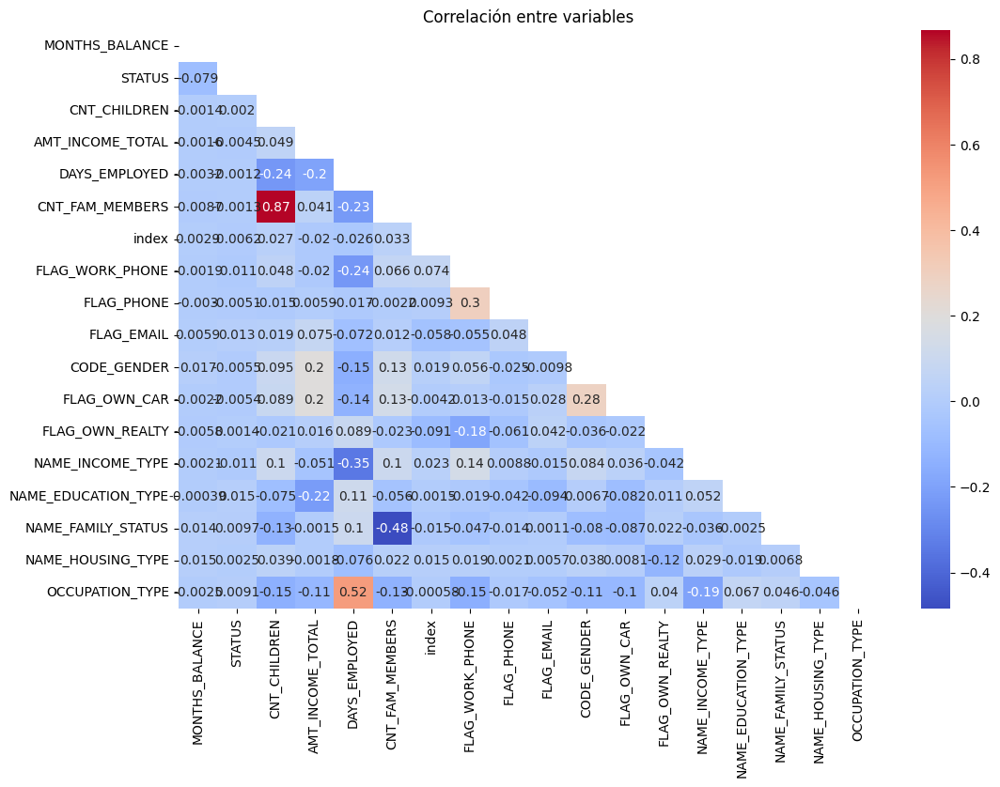

In [112]:
# correlation between variables

corr = df_complete_no_nan_no_out.iloc[:,2:].drop('FLAG_MOBIL', axis=1).select_dtypes('number').corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', mask=mask)
plt.title('Correlación entre variables')
plt.show()

**INSIGHTS**:

- *Feature Selection:* The strong correlation between CNT_FAM_MEMBERS and CNT_CHILDREN implies that one of these features might be redundant and could potentially be removed to reduce multicollinearity in the model.

- *Target Variable Relationship*: The relatively low correlation values with STATUS suggest that the relationships between the target variable and the features are complex and possibly non-linear, indicating that more sophisticated modeling techniques (like gradient boosting) might be required to capture these relationships effectively.

In [113]:
# pair list of the most correlated variables

corr_pairs = corr.unstack().sort_values(ascending=False).drop_duplicates()
corr_pairs


OCCUPATION_TYPE  OCCUPATION_TYPE       1.000000
CNT_CHILDREN     CNT_FAM_MEMBERS       0.867302
DAYS_EMPLOYED    OCCUPATION_TYPE       0.523337
FLAG_WORK_PHONE  FLAG_PHONE            0.301871
CODE_GENDER      FLAG_OWN_CAR          0.283760
                                         ...   
DAYS_EMPLOYED    CNT_FAM_MEMBERS      -0.228652
FLAG_WORK_PHONE  DAYS_EMPLOYED        -0.237919
CNT_CHILDREN     DAYS_EMPLOYED        -0.239702
DAYS_EMPLOYED    NAME_INCOME_TYPE     -0.346868
CNT_FAM_MEMBERS  NAME_FAMILY_STATUS   -0.484805
Length: 154, dtype: float64

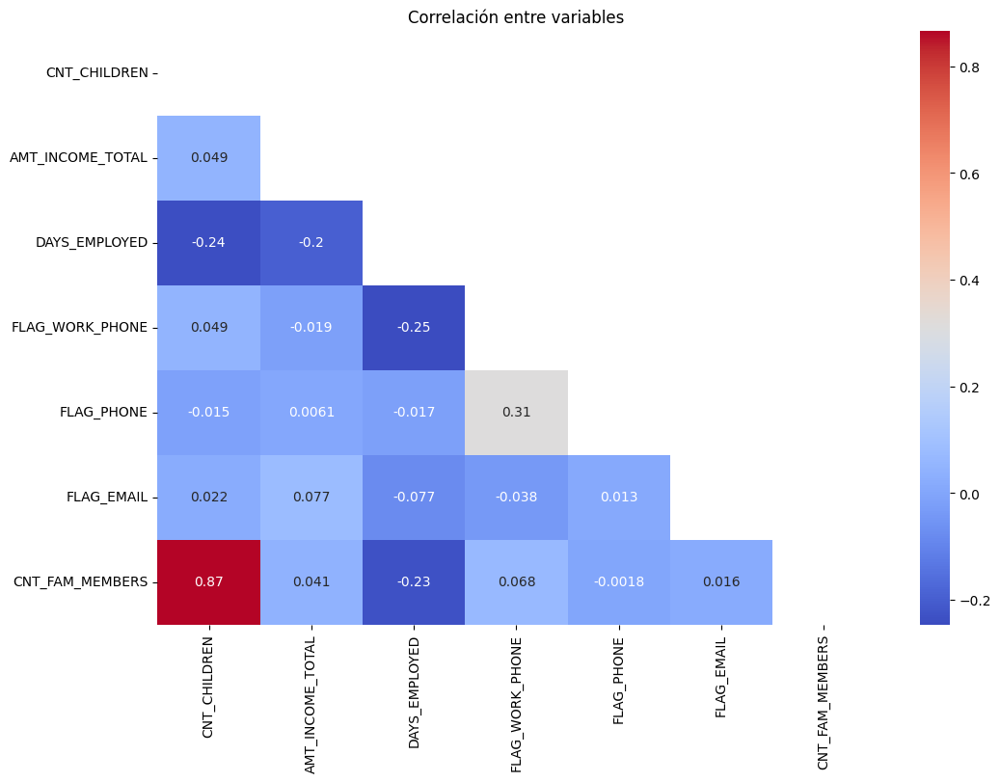

In [114]:
# correlation of numerical variables only (with missing values)

corr = df_merged_copy_no_outliers.iloc[:,2:].drop('FLAG_MOBIL', axis=1).select_dtypes('number').corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', mask=mask)
plt.title('Correlación entre variables')
plt.show()

## 4) Data modelling and analysis

### Creating 'target' variable from STATUS

In [178]:
df_complete_no_nan_no_out_testing = df_merged_imputed.copy()

In [179]:
# mapping the STATUS variable to numeric values

dict = {'C': -1, 'X': -2, '0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5}

df_complete_no_nan_no_out_testing['STATUS'] = df_complete_no_nan_no_out_testing['STATUS'].map(dict)

df_complete_no_nan_no_out_testing['STATUS'].dtype

dtype('int64')

In [190]:
# dropping STATUS rows with -2 values

df_complete_no_nan_no_out = df_complete_no_nan_no_out[df_complete_no_nan_no_out['STATUS'] != -2]


In [191]:
df_complete_no_nan_no_out['STATUS'].value_counts()

STATUS
-1    293095
 0    256838
 1      7623
 5      1338
 2       693
 3       244
 4       180
Name: count, dtype: int64

In [192]:
unique_ids = df_complete_no_nan_no_out_testing['ID'].unique()
len(unique_ids)

29237

In [196]:
# one way for proportion of paid clients

status_proportion = {}

for id in unique_ids:
    pagado = len(df_complete_no_nan_no_out[df_complete_no_nan_no_out['ID'] == id][df_complete_no_nan_no_out['STATUS'] == -1])
    total = len(df_complete_no_nan_no_out[df_complete_no_nan_no_out['ID'] == id])
    proportion = pagado / total
    status_proportion[id] = proportion

status_proportion

C:\Users\mar27\AppData\Local\Temp\ipykernel_25324\1732144705.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pagado = len(df_complete_no_nan_no_out[df_complete_no_nan_no_out['ID'] == id][df_complete_no_nan_no_out['STATUS'] == -1])
C:\Users\mar27\AppData\Local\Temp\ipykernel_25324\1732144705.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pagado = len(df_complete_no_nan_no_out[df_complete_no_nan_no_out['ID'] == id][df_complete_no_nan_no_out['STATUS'] == -1])
C:\Users\mar27\AppData\Local\Temp\ipykernel_25324\1732144705.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pagado = len(df_complete_no_nan_no_out[df_complete_no_nan_no_out['ID'] == id][df_complete_no_nan_no_out['STATUS'] == -1])
C:\Users\mar27\AppData\Local\Temp\ipykernel_25324\1732144705.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  pagado = len(df_complete_no_nan_no_out[df_complete_no_

{np.int64(5008804): 0.8666666666666667,
 np.int64(5008805): 0.8571428571428571,
 np.int64(5008806): 0.5,
 np.int64(5008808): 0.0,
 np.int64(5008810): 0.7142857142857143,
 np.int64(5008811): 0.8181818181818182,
 np.int64(5008812): 0.0,
 np.int64(5008813): 0.0,
 np.int64(5008814): 0.0,
 np.int64(5008815): 0.0,
 np.int64(5008820): 0.0,
 np.int64(5008821): 0.0,
 np.int64(5008822): 0.0,
 np.int64(5008823): 0.0,
 np.int64(5008824): 0.0,
 np.int64(5008825): 0.0,
 np.int64(5008826): 0.6,
 np.int64(5008827): 0.5,
 np.int64(5008830): 0.5161290322580645,
 np.int64(5008831): 0.21052631578947367,
 np.int64(5008832): 0.5588235294117647,
 np.int64(5008834): 0.8888888888888888,
 np.int64(5008835): 0.0,
 np.int64(5008836): 0.9411764705882353,
 np.int64(5008837): 0.9411764705882353,
 np.int64(5008838): 0.0,
 np.int64(5008839): 0.2857142857142857,
 np.int64(5008840): 0.8214285714285714,
 np.int64(5008841): 0.0,
 np.int64(5008842): 0.0,
 np.int64(5008843): 0.6666666666666666,
 np.int64(5008844): 0.2121212

In [197]:
status_proportion_df = pd.DataFrame(status_proportion.items(), columns=['ID', 'proportion'])
status_proportion_df

,ID,proportion
0,5008804,0.866667
1,5008805,0.857143
2,5008806,0.500000
3,5008808,0.000000
4,5008810,0.714286
...,...,...
29232,5150479,1.000000
29233,5150480,0.769231
29234,5150482,0.333333
29235,5150485,0.000000


In [198]:
len(status_proportion_df[status_proportion_df['proportion'] > 0.8])/29237 

0.177788418784417

There is a clear imbalance in the data (17% would be considered future customers, and 83% would not). To improve this situation and the performance of the binary classification models, oversampling or undersampling techniques could be applied.

In [201]:
# another way for proportion of paid clients

df_summary = df_complete_no_nan_no_out.groupby('ID').agg(total_status=('STATUS', 'sum'),count_id=('STATUS', 'count')).reset_index()
df_summary

,ID,total_status,count_id
0,5008804,-24,30
1,5008805,-22,28
2,5008806,-14,28
3,5008808,0,4
4,5008810,-15,21
...,...,...,...
29232,5150479,-1,1
29233,5150480,-20,26
29234,5150482,-6,18
29235,5150485,0,2


In [202]:
df_summary['proportion'] = abs(df_summary['total_status'] / df_summary['count_id'])
df_summary

,ID,total_status,count_id,proportion
0,5008804,-24,30,0.800000
1,5008805,-22,28,0.785714
2,5008806,-14,28,0.500000
3,5008808,0,4,0.000000
4,5008810,-15,21,0.714286
...,...,...,...,...
29232,5150479,-1,1,1.000000
29233,5150480,-20,26,0.769231
29234,5150482,-6,18,0.333333
29235,5150485,0,2,0.000000


In [204]:
# adding the target variable to the df

for id in df_summary['ID']:
	condition = df_summary.loc[df_summary['ID'] == id, 'proportion'].iloc[0] > 0.8
	df_complete_no_nan_no_out_testing.loc[df_complete_no_nan_no_out_testing['ID'] == id, 'target'] = int(condition)

In [206]:
df_complete_no_nan_no_out_testing.isnull().sum()

index                  0
ID                     0
MONTHS_BALANCE         0
STATUS                 0
CNT_CHILDREN           0
AMT_INCOME_TOTAL       0
DAYS_EMPLOYED          0
CNT_FAM_MEMBERS        0
Letter                 0
index                  0
FLAG_MOBIL             0
FLAG_WORK_PHONE        0
FLAG_PHONE             0
FLAG_EMAIL             0
CODE_GENDER            0
FLAG_OWN_CAR           0
FLAG_OWN_REALTY        0
NAME_INCOME_TYPE       0
NAME_EDUCATION_TYPE    0
NAME_FAMILY_STATUS     0
NAME_HOUSING_TYPE      0
OCCUPATION_TYPE        0
target                 0
dtype: int64

### Modelos de clasificacion

#### Splitting the data

In [243]:
# splitting in X e y

X = df_complete_no_nan_no_out.drop(['STATUS', 'target', 'Letter', 'index', 'ID'], axis=1)
y = df_complete_no_nan_no_out['target']


              precision    recall  f1-score   support

           0       0.71      1.00      0.83     79702
           1       0.00      0.00      0.00     32301

    accuracy                           0.71    112003
   macro avg       0.36      0.50      0.42    112003
weighted avg       0.51      0.71      0.59    112003



c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.05602e-16): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, 

In [ ]:
# splitting in train and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


#### Ridge Classifier

In [ ]:

ridge = RidgeClassifier()
ridge.fit(X_train, y_train)
y_pred = ridge.predict(X_test)

accuracy_score(y_test, y_pred)

print(classification_report(y_test, y_pred))

#### AdaBoost Classifier

In [244]:
adaboost = AdaBoostClassifier()
adaboost.fit(X_train, y_train)
y_pred = adaboost.predict(X_test)

accuracy_score(y_test, y_pred)

print(classification_report(y_test, y_pred))

c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


              precision    recall  f1-score   support

           0       0.71      1.00      0.83     79702
           1       0.65      0.00      0.01     32301

    accuracy                           0.71    112003
   macro avg       0.68      0.50      0.42    112003
weighted avg       0.69      0.71      0.59    112003



In [246]:
# searching for the best hyperparameters for the model

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}

adaboost = AdaBoostClassifier(random_state=42)

# para enconrar los mejores hiperparametros para el modelo
grid_search = GridSearchCV(estimator=adaboost, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_adaboost = AdaBoostClassifier(n_estimators=best_params['n_estimators'], learning_rate=best_params['learning_rate'], random_state=42)
best_adaboost.fit(X_train, y_train)

y_pred = best_adaboost.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Best hyperparameters:", best_params)
print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)




c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Best hyperparameters: {'learning_rate': 1.0, 'n_estimators': 200}
Accuracy: 0.7129719739649831
Classification Report:
               precision    recall  f1-score   support

           0       0.71      1.00      0.83     79702
           1       0.69      0.01      0.02     32301

    accuracy                           0.71    112003
   macro avg       0.70      0.50      0.42    112003
weighted avg       0.71      0.71      0.60    112003

Tiempo de ejecución: 240.9435 segundos


#### Logistic Regression

In [247]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

accuracy_score(y_test, y_pred)

print(classification_report(y_test, y_pred))


c:\Users\mar27\OneDrive\Documentos\CURSOS\DATA_ANALYTICS_UPGRADEHUB\my_second_env\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


              precision    recall  f1-score   support

           0       0.71      1.00      0.83     79702
           1       0.41      0.01      0.01     32301

    accuracy                           0.71    112003
   macro avg       0.56      0.50      0.42    112003
weighted avg       0.62      0.71      0.59    112003



#### Gradient Boosting Classifier

In [248]:
gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)
y_pred = gbc.predict(X_test)

accuracy_score(y_test, y_pred)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.71      1.00      0.83     79702
           1       0.88      0.01      0.03     32301

    accuracy                           0.71    112003
   macro avg       0.80      0.51      0.43    112003
weighted avg       0.76      0.71      0.60    112003



In [249]:
# searching for the best hyperparameters for the model

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

gbc = GradientBoostingClassifier(random_state=42)

grid_search = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_gbc = GradientBoostingClassifier(
    n_estimators=best_params['n_estimators'],
    learning_rate=best_params['learning_rate'],
    max_depth=best_params['max_depth'],
    random_state=42
)
best_gbc.fit(X_train, y_train)

y_pred = best_gbc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Best hyperparameters:", best_params)
print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)


Best hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}
Accuracy: 0.8114157656491344
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.97      0.88     79702
           1       0.85      0.42      0.56     32301

    accuracy                           0.81    112003
   macro avg       0.83      0.69      0.72    112003
weighted avg       0.82      0.81      0.79    112003

Tiempo de ejecución: 1822.3036 segundos


In [250]:
# saving classification report to an excel file

classification_rep = classification_report(y_test, y_pred, output_dict=True)
classification_rep_df = pd.DataFrame(classification_rep).transpose()
classification_rep_df.to_excel('classification_report.xlsx')

In [251]:
# saving the best model

joblib.dump(best_gbc, 'best_gbc_model.pkl')

['best_gbc_model.pkl']

In [252]:
# selecting the most features

X_train_selected = X_train[['MONTHS_BALANCE', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_EMPLOYED', 'FLAG_EMAIL', 'FLAG_WORK_PHONE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_FAM_MEMBERS']]
X_test_selected = X_test[['MONTHS_BALANCE', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_EMPLOYED', 'FLAG_EMAIL', 'FLAG_WORK_PHONE', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_FAM_MEMBERS']]

In [253]:
# retraining the model with the selected features

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

gbc2 = GradientBoostingClassifier(random_state=42)

grid_search2 = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1)
grid_search2.fit(X_train_selected, y_train)

best_params2 = grid_search2.best_params_

best_gbc2 = GradientBoostingClassifier(
    n_estimators=best_params['n_estimators'],
    learning_rate=best_params['learning_rate'],
    max_depth=best_params['max_depth'],
    random_state=42
)
best_gbc2.fit(X_train_selected, y_train)

y_pred2 = best_gbc2.predict(X_test_selected)

accuracy2 = accuracy_score(y_test, y_pred2)
classification_rep2 = classification_report(y_test, y_pred2)

In [254]:
print("Best hyperparameters:", best_params2)
print("Accuracy:", accuracy2)
print("Classification Report:\n", classification_rep2)


Best hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}
Accuracy: 0.791702007981929
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.97      0.87     79702
           1       0.84      0.34      0.49     32301

    accuracy                           0.79    112003
   macro avg       0.81      0.66      0.68    112003
weighted avg       0.80      0.79      0.76    112003



In [255]:
classification_rep2 = classification_report(y_test, y_pred2, output_dict=True)
classification_rep_df2 = pd.DataFrame(classification_rep2).transpose()
classification_rep_df2.to_excel('classification_report2.xlsx')


# saving the model

joblib.dump(best_gbc2, 'best_gbc_model2.pkl')

['best_gbc_model2.pkl']

### 5) Obtencion de resultados, visualizacion y conclusiones

In [256]:
# comparing accuracy (with all variables: 60m 30.1s) and accuracy 2 (with selected variables: 23m 16.6s)

accuracy, accuracy2


(0.8114157656491344, 0.791702007981929)

In [257]:
# compararing classification report and classification report 2

classification_rep_df, classification_rep_df2



(              precision    recall  f1-score        support
 0              0.804768  0.970402  0.879858   79702.000000
 1              0.851607  0.419120  0.561766   32301.000000
 accuracy       0.811416  0.811416  0.811416       0.811416
 macro avg      0.828187  0.694761  0.720812  112003.000000
 weighted avg   0.818276  0.811416  0.788122  112003.000000,
               precision    recall  f1-score        support
 0              0.785526  0.972924  0.869240   79702.000000
 1              0.837586  0.344540  0.488243   32301.000000
 accuracy       0.791702  0.791702  0.791702       0.791702
 macro avg      0.811556  0.658732  0.678741  112003.000000
 weighted avg   0.800540  0.791702  0.759362  112003.000000)

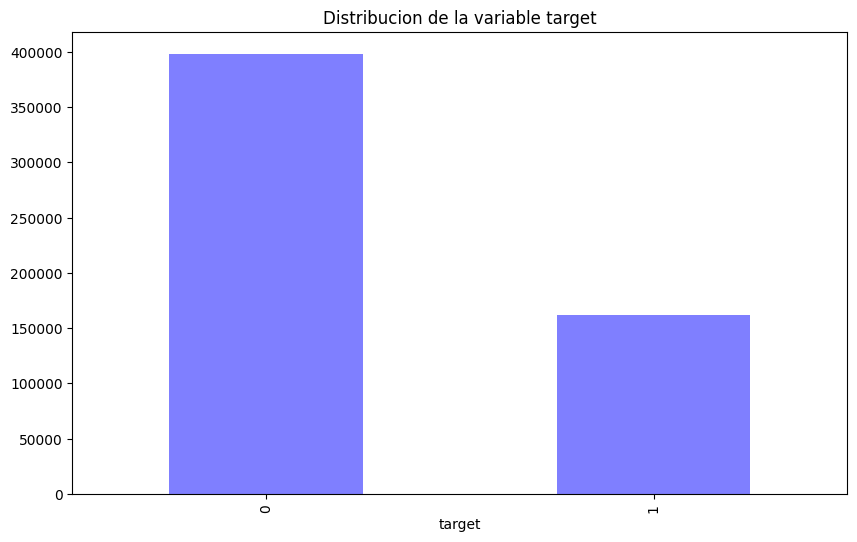

In [258]:
# visualizing the results

df_complete_no_nan_no_out['target'].value_counts().plot(kind='bar', color='blue', alpha=0.5, figsize=(10,6), title='Distribucion de la variable target')
plt.show()

In [260]:
# seeing how long it takes to train the model

start_time = time.time()

## Best hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}

gbc = GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=300, random_state=42)
gbc.fit(X, y) # todas las variables

# execution time

end_time = time.time()
execution_time = end_time - start_time
print(f"Tiempo de ejecución: {execution_time:.4f} segundos")

Tiempo de ejecución: -1236.5629 segundos


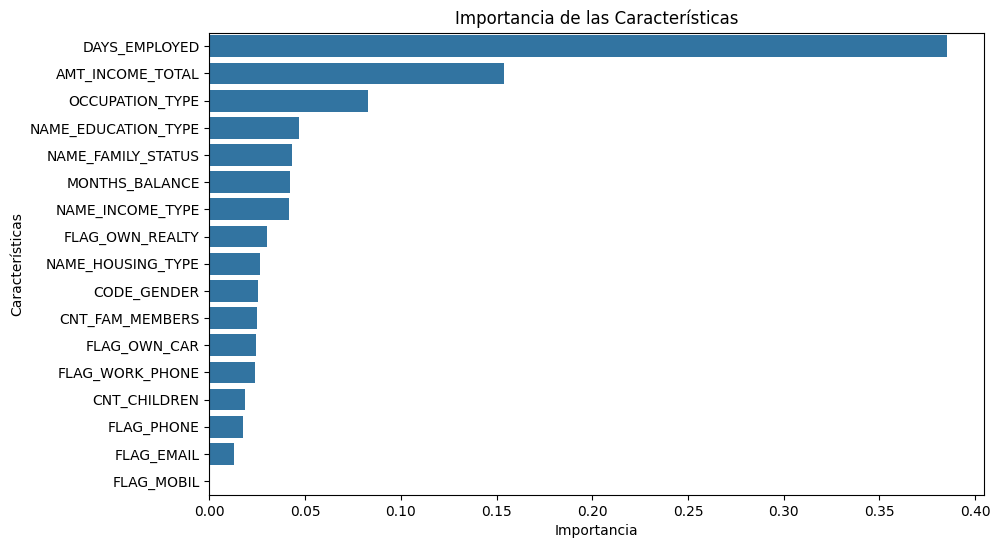

In [261]:

# visualization of the importance of the characteristics

feature_importance = pd.Series(gbc.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance.values, y=feature_importance.index)
plt.title('Importancia de las Características')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()


**INSIGHTS**:

- DAYS_EMPLOYED: Clients with stable, long-term employment may be more likely to be considered good prospects.

- AMT_INCOME_TOTAL: Clients with higher incomes are likely to be more financially stable and therefore more likely to be eligible.

- OCCUPATION_TYPE: Certain occupations may be associated with higher income levels, job stability, and lower financial risk, which affects the decision to grant the split.

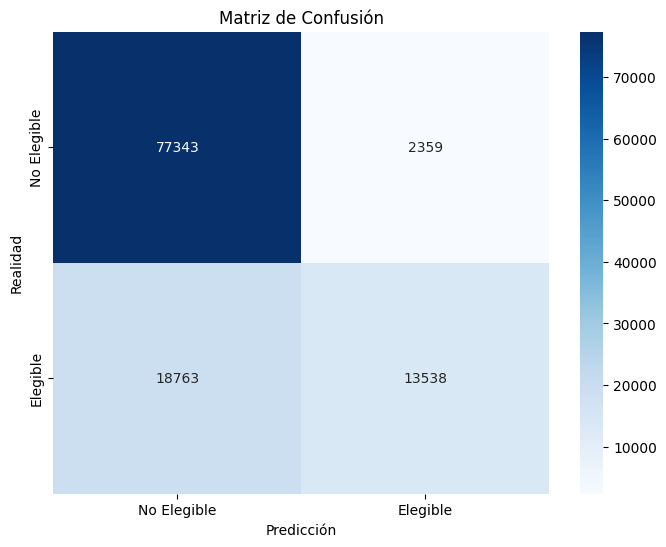

In [262]:

# confusion matrix

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Elegible', 'Elegible'], yticklabels=['No Elegible', 'Elegible'])
plt.title('Matriz de Confusión')
plt.xlabel('Predicción')
plt.ylabel('Realidad')
plt.show()


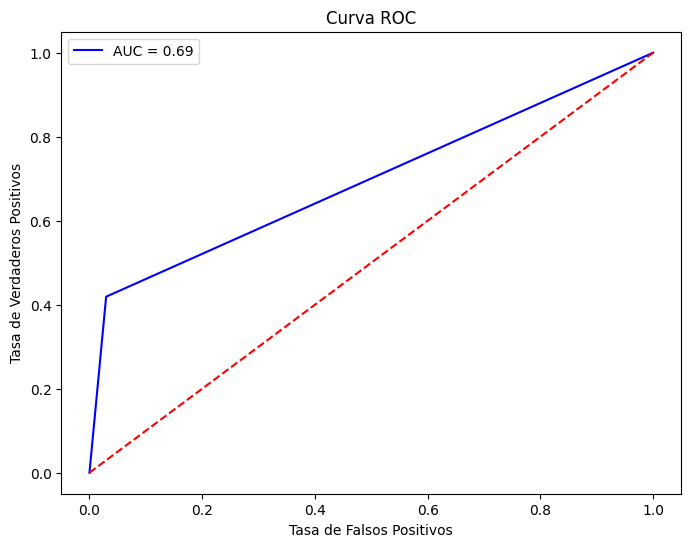

In [263]:

# ROC and AUC curves

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.title('Curva ROC')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.legend()
plt.show()


**ROC CURVE INTERPRETATION** AUC = 0.69

- AUC = 0.69: indicates that the model has a moderate ability to distinguish between positive and negative classes, suggesting that the model is better than a random classifier but there is still room for improvement in its performance.

- The blue curve is above the dotted red line for the most part (positive), although it is not very close to the upper left corner, indicating that the model is not extremely accurate.

In [264]:
print('Reporte de Clasificación:')
print(classification_report(y_test, y_pred))

Reporte de Clasificación:
              precision    recall  f1-score   support

           0       0.80      0.97      0.88     79702
           1       0.85      0.42      0.56     32301

    accuracy                           0.81    112003
   macro avg       0.83      0.69      0.72    112003
weighted avg       0.82      0.81      0.79    112003



In [265]:
# with selected variables

start_time = time.time()


## Best hyperparameters: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 300}

gbc2 = GradientBoostingClassifier(learning_rate=0.2, max_depth=5, n_estimators=300, random_state=42)
gbc2.fit(X_train_selected, y_train)


end_time = time.time()
execution_time = end_time - start_time
print(f"Tiempo de ejecución: {execution_time:.4f} segundos")

Tiempo de ejecución: -2555.2058 segundos


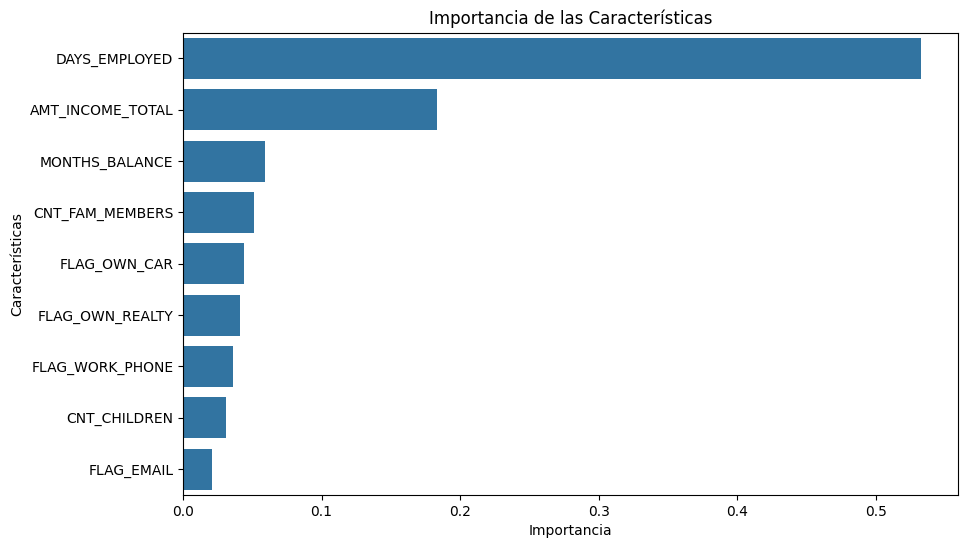

In [266]:


feature_importance = pd.Series(gbc2.feature_importances_, index=X_train_selected.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance.values, y=feature_importance.index)
plt.title('Importancia de las Características')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()

## **Conclusiones** 

- To classify clients according to their ability to pay the insurance premium, a binary classification model was used based on the target variable, which indicates whether or not a client is able to pay the insurance premium.

- The model evaluation metrics were mainly accuracy, F1 score and model recall, although the ROC curve, the area under the curve (AUC) and the confusion matrix were also evaluated.

- The model with the best metric was the Gradient Boosting Classifier, which showed good results in terms of accuracy and F1 score, although recall for class 1 (fractionation is granted) was relatively low, indicating that the model might be losing several potential clients.

- Removal of non-relevant features improved the simplicity of the model, albeit with a slight decrease in performance, highlighting the importance of a balance between model si


**Next steps:

    - Deploy the model in a runtime environment.

    - Continually monitor model performance with new data and retrain as needed.


**Improved results**:

    - The data set was unbalanced, which could have affected model performance. It is recommended to try resampling techniques, such as minority class oversampling or majority class undersampling, or the use of advanced techniques such as SMOTE (Synthetic Minority Over-sampling Technique) to address class imbalance.

    - The possibility of using advanced classification models, such as Random Forest, Support Vector Machine (SVM) or Neural Networks, could be explored to improve model performance.

    - The inclusion of additional features, such as geographic information, contact information or customer behavior information, could be considered to improve the accuracy of the model.